<a href="https://colab.research.google.com/github/mvoassis/SP-property-analysis/blob/main/SP_Property_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **São Paulo Property Analysis**
#### *Marcos V. O. Assis (mvoassis@gmail.com)*
#### [Colab Notebook](https://colab.research.google.com/drive/1T7TjRwgA3IAGiXK0hMbY2UNRsofURmZ0?usp=sharing)

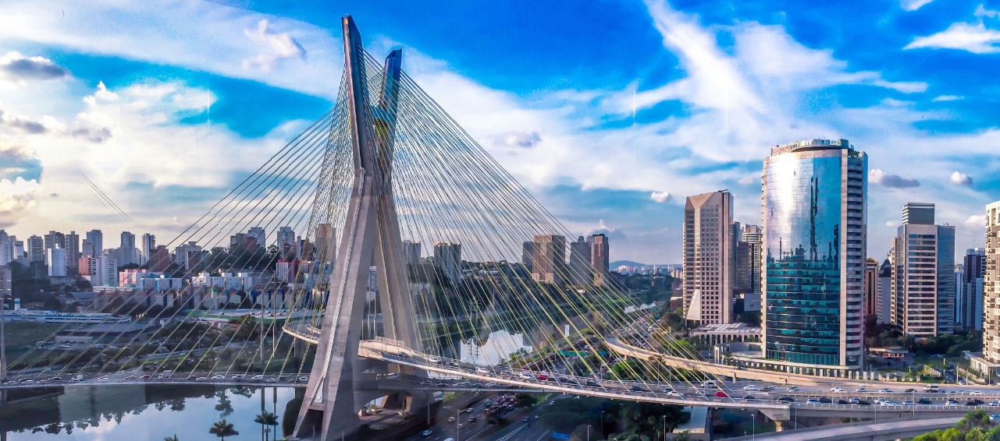





***

> ## Objectives:

1.   Perform a descriptive analysis to generate insights about São Paulo's properties.
2.   Propose a regression model able to predict a property value based on its features, like Area (size), number of rooms, geographic location, and so on. 

> ## DataSets (Details on the 'Uploading Datasets' section):

1. 'Properties Dataset' - **House price data of Sao Paulo** (Kaggle)
2. 'IBGE Dataset' - **2010 Demographic Census Information Base: Universe Results by Census Sector** *(Base de informações do Censo Demográfico 2010: Resultados do Universo por setor censitário)*
3. 'Addresses Dataset' - **Address dataset of all brazilian states (UF)**
4. 'Geolocation Dataset' - **Mesh of Census Sectors - São Paulo** *(Malha de Setores Censitários IBGE - São Paulo)*

> ## Approach:

1. Perform a Descriptive Analysis of the 'Properties Dataset';
2. Merge 'Properties Dataset' and 'IBGE Dataset':
> * First, merge 'Properties Dataset' to 'Addresses Dataset' to add *latitude* and *longitude* features.
> * Create a geopandas Point feature on the dataset, containing coordinates of *latitude* and *longitude*.
> * Import 'Geolocation Dataset', and map the ID of Census Sectors: 'draw' the census sectors as polygons, and verify which coordinate point correspond to each address (latitude and longitude coordinates).
> * Finally, merge 'Properties Dataset' with 'IBGE Dataset', based on the Census Sector ID. 
3. Implement and test different Regression Algorithms to predict property Value based on different features sets.
4. Discussion and conclusions on the achieved results.


> ## Files: 

* enderecos.csv - Address dataset file
* 35SEE250GC_SIR.{dbf,prj,shp,shx} - SP Geolocation dataset (all files needed)
* data_sale_censo.csv - Merged dataset (if you want to start running from 'Predicting Property Values' section)


***


# **Uploading Datasets**

## Properties Dataset

**House price data of Sao Paulo** (Kaggle)

This is the base dataset used for descriptive analysis of São Paulo's properties and value prediction (after data augmentation through merging with other datasets).

> *Original Dataset*

https://www.kaggle.com/datasets/kaggleshashankk/house-price-data-of-sao-paulo

> *Used Dataset (Containing some initial data treatment)*

https://gist.githubusercontent.com/tgcsantos/3bdb29eba6ce391e90df2b72205ba891/raw/22fa920e80c9fa209a9fccc8b52d74cc95d1599b/dados_imoveis.csv

> *Features*

* Rua (Street) - Street location of where house belongs
* Cidade (City) - City where House is located
* Bairro (Neighborhood) - Neighborhood where House is located
* Metragem (Area) - Area in meter square
* quartos(Rooms) - number of Rooms in the house
* banheiros(Bathrooms) - number of bathrooms in the house
* vagas(parking space) - parking space per vehicle
* Valor (Value) - Price of the house, which is in Brazilian currency BRL (R\$)

In [1]:
import pandas as pd               #loading pandas
import seaborn as sns             #loading seaborn
import matplotlib.pyplot as plt   #loading pyplot
from shapely.geometry import Point, Polygon
%matplotlib inline  


url = 'https://gist.githubusercontent.com/tgcsantos/3bdb29eba6ce391e90df2b72205ba891/raw/22fa920e80c9fa209a9fccc8b52d74cc95d1599b/dados_imoveis.csv'
data = pd.read_csv(url)

In [2]:
data.sample(10)

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
4900,Rua São Luís,Guaianases,São Paulo,90,3,3,2,R$ 750.000
8225,NaN,Santo Amaro,São Paulo,190,4,5,4,R$ 2.100.000
533,"Rua Califórnia, 37",Cidade Monções,São Paulo,532,4,6,4,R$ 9.396.000
9004,"Rua Dom Macário, 1300",Saúde,São Paulo,233,3,4,6,R$ 1.800.000
7743,NaN,Pinheiros,São Paulo,460,4,5,4,R$ 5.500.000
7881,"Rua Araporã, 162",Vila Polopoli,São Paulo,61,2,2,2,R$ 419.000
7060,"Rua Olímpia Lemes da Silva, 108",Jardim das Vertentes,São Paulo,150,3,3,2,R$ 700.000
467,Rua Cerro Corá,Vila Romana,São Paulo,98,2,2,1,R$ 791.000
8433,"Avenida Morumbi, 488",Morumbi,São Paulo,400,4,2,4,R$ 1.600.003
6146,NaN,Jardim Patente,São Paulo,177,2,1,2,R$ 450.000


In [3]:
data.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,R$ 685.000
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,R$ 540.000


### Correcting variable "Value"

In [4]:
data['Valor'].str.split(expand=True)

,0,1,2
0,R$,7.000.000,None
1,R$,3.700.000,None
2,R$,380.000,None
3,R$,685.000,None
4,R$,540.000,None
...,...,...,...
10003,R$,665.000,None
10004,R$,2.300.000,None
10005,R$,1.050.000,None
10006,R$,2.200,/Mês


In [5]:
# Rows with '/Mês', '/Ano', '/Dia' means rental, not sale.

data['Valor'].str.split(expand=True)[2].unique()

array([None, '/Mês', '/Ano', '/Dia'], dtype=object)

In [6]:
data[['Moeda', 'Valor_Anuncio', 'Tipo_Anuncio']] = data['Valor'].str.split(expand=True)

# excluding non-sale rows

data = data[data['Tipo_Anuncio'].isna()]

data.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor,Moeda,Valor_Anuncio,Tipo_Anuncio
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,R$ 7.000.000,R$,7.000.000,None
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,R$ 3.700.000,R$,3.700.000,None
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,R$ 380.000,R$,380.000,None
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,R$ 685.000,R$,685.000,None
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,R$ 540.000,R$,540.000,None


In [7]:
# dropping columns with single values
del data['Moeda']
del data['Tipo_Anuncio']

# dropping duplicated columns
del data['Valor']

#saving in another DataFrame
data_sale = data.copy()

data_sale.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7.000.000
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3.700.000
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380.000
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685.000
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540.000


In [8]:
# converting object to float

data_sale['Valor_Anuncio'] = data_sale['Valor_Anuncio'].str.replace('.','').astype(float)
data_sale.head()



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  This is separate from the ipykernel package so we can avoid doing imports until


,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.0
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.0
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.0
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685000.0
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540000.0


In [9]:
data_sale.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9156 entries, 0 to 10007
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Rua            6107 non-null   object 
 1   Bairro         9146 non-null   object 
 2   Cidade         9156 non-null   object 
 3   Metragem       9156 non-null   int64  
 4   Quartos        9156 non-null   int64  
 5   Banheiros      9156 non-null   int64  
 6   Vagas          9156 non-null   int64  
 7   Valor_Anuncio  9156 non-null   float64
dtypes: float64(1), int64(4), object(3)
memory usage: 643.8+ KB


## IBGE Dataset

 **2010 Demographic Census Information Base: Universe Results by Census Sector** *(Base de informações do Censo Demográfico 2010: Resultados do Universo por setor censitário)*

> Data dictionary (page 45) - https://drive.google.com/file/d/1WVTqfKtHOOk5X1AWaSOn6NLaO7cix2m4/view

The used Dataset is the "Básico_UF.csv". However, this dataset contains information on all Brazilian states. Thus, a preprocessing was performed to select only information regarding São Paulo (SP) state. The following link provides the resulting dataset:

> Dataset - https://gist.githubusercontent.com/tgcsantos/85f8c7b0a2edbc3e27fcad619b37d886/raw/a4954781e6bca9cb804062a3eea0b3b84679daf4/Basico_SP1.csv

In [10]:
ibge_url = 'https://gist.githubusercontent.com/tgcsantos/85f8c7b0a2edbc3e27fcad619b37d886/raw/a4954781e6bca9cb804062a3eea0b3b84679daf4/Basico_SP1.csv'
data_ibge = (pd.read_csv(ibge_url, sep=';', decimal=',', thousands='.', encoding='ISO-8859-1'))

data_ibge.rename(columns={'Cod_Grandes Regi�es': 'Cod_Grandes_Regioes'}, inplace=True)

data_ibge.head()

,Cod_setor,Cod_Grandes Regiï¿½es,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V004,V005,V006,V007,V008,V009,V010,V011,V012,Unnamed: 33
0,355030801000001,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,2.32,2091.32,8532451.78,2164.55,8673276.78,1227.41,4285771.99,1713.75,5152087.86,NaN
1,355030801000002,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,2.09,1650.09,3983441.31,1717.44,4030519.99,1045.78,2572133.32,1468.08,2991546.94,NaN
2,355030801000003,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,3.08,1280.43,5474593.06,2349.53,7553913.02,902.97,2735492.52,1786.79,3837674.74,NaN
3,355030801000004,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,2.26,1119.59,3572955.10,1859.13,4567289.50,869.09,2122409.02,1567.41,2735383.24,NaN
4,355030801000005,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,2.35,1416.90,2240207.58,1581.66,2240109.39,917.71,1570047.75,1356.35,1725877.85,NaN


### Verifying which columns could be dropped

In [11]:
data_ibge.columns

Index(['Cod_setor', 'Cod_Grandes Regiï¿½es', 'Nome_Grande_Regiao', 'Cod_UF',
       'Nome_da_UF ', 'Cod_meso', 'Nome_da_meso', 'Cod_micro', 'Nome_da_micro',
       'Cod_RM', 'Nome_da_RM', 'Cod_municipio', 'Nome_do_municipio',
       'Cod_distrito', 'Nome_do_distrito', 'Cod_subdistrito',
       'Nome_do_subdistrito', 'Cod_bairro', 'Nome_do_bairro', 'Situacao_setor',
       'Tipo_setor', 'V001', 'V002', 'V003', 'V004', 'V005', 'V006', 'V007',
       'V008', 'V009', 'V010', 'V011', 'V012', 'Unnamed: 33'],
      dtype='object')

In [12]:
# Dropping columns with null values

data_ibge.dropna(how='all', axis=1, inplace=True)

In [13]:
data_ibge.head(3)

,Cod_setor,Cod_Grandes Regiï¿½es,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,355030801000001,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,3.01,2.32,2091.32,8532451.78,2164.55,8673276.78,1227.41,4285771.99,1713.75,5152087.86
1,355030801000002,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,2.98,2.09,1650.09,3983441.31,1717.44,4030519.99,1045.78,2572133.32,1468.08,2991546.94
2,355030801000003,3,Regiï¿½o Sudeste,35,Sï¿½o Paulo,3515,Metropolitana de Sï¿½o Paulo,35061,Sï¿½o Paulo,20,...,3.31,3.08,1280.43,5474593.06,2349.53,7553913.02,902.97,2735492.52,1786.79,3837674.74


## Adresses Dataset

**Address dataset of all Brazilian states (UF)**

Complete address, including geographic coordinates, of all brazilian addresses.

> *Dataset*

https://drive.google.com/file/d/1u2qPFtYaE4of3Vb3d7yQEVEbS5FdQ_FP/view

> *Features* 

* tipo_logr - Type of address (Street, Avenue, etc.)
* logr_nome - Name of the address
* logr_compl - tipo_logr + logr_nome
* numero - Numeric identification of the address
* bairro - neighborhood
* nome_localidade - Name of the City
* sigla_uf - Federation unit (State) abbreviation 
* cep - postal code
* latitude - Geographic location
* longitude - Geographic location

In [14]:
addr_url = 'enderecos.csv'
addresses = pd.read_csv(addr_url)
addresses.head(3)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude
0,Rua,Armando Silveira,Rua Armando Silveira,NaN,Divisa,Santana do Livramento,RS,97573200.0,-30.882674,-55.548830
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.0,-21.190276,-50.448686
2,Rua,Prefeito Agenor Barcelos Feio,Rua Prefeito Agenor Barcelos Feio,NaN,Registro,Santana do Livramento,RS,97571090.0,-30.855721,-55.555757


In [15]:
# selecting only SP addresses

addr_sp = addresses[addresses['sigla_uf']=='SP']
addr_sp.head(3)

,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.0,-21.190276,-50.448686
413269,Rua,A,Rua A,NaN,Jardim Glória,Americana,SP,13468220.0,-22.756531,-47.343738
413270,Rua,A,Rua A,NaN,Jardim São Roque,Americana,SP,13469414.0,-22.743734,-47.348631


### Preparing for merging with Properties Dataset

In [16]:
# creating new column to merge 'tipo_logr' and 'logr_nome'

addr_sp["rua"] = addr_sp["tipo_logr"] + " " + addr_sp["logr_nome"]
addr_sp["rua"] = addr_sp["rua"].str.lower().str.strip() # normalize data
addr_sp.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,tipo_logr,logr_nome,logr_compl,numero,bairro,nome_localidade,sigla_uf,cep,latitude,longitude,rua
1,Rua,João Antônio Vasconcelos,Rua João Antônio Vasconcelos - até 627/628,627,Amizade,Araçatuba,SP,16074320.0,-21.190276,-50.448686,rua joão antônio vasconcelos
413269,Rua,A,Rua A,NaN,Jardim Glória,Americana,SP,13468220.0,-22.756531,-47.343738,rua a
413270,Rua,A,Rua A,NaN,Jardim São Roque,Americana,SP,13469414.0,-22.743734,-47.348631,rua a
413271,Rua,A,Rua A,NaN,Iate Clube de Campinas,Americana,SP,13475620.0,-22.737846,-47.333569,rua a
413272,Rua,João Bandini,Rua João Bandini,NaN,Jardim Miriam,Americana,SP,13469072.0,-22.744283,-47.351588,rua joão bandini


## Geolocation Dataset

**Mesh of Census Sectors - São Paulo** (Malha de Setores Censitários IBGE - São Paulo)

> *What is?* 

https://www.ibge.gov.br/geociencias/organizacao-do-territorio/malhas-territoriais/26565-malhas-de-setores-censitarios-divisoes-intramunicipais.html?=&t=o-que-e

> *Dataset*

* [IBGE Download](https://www.ibge.gov.br/geociencias/downloads-geociencias.html?caminho=organizacao_do_territorio/malhas_territoriais/malhas_de_setores_censitarios__divisoes_intramunicipais/2020/Malha_de_setores_(shp)_por_UFs)
* [Direct Download](https://drive.google.com/drive/folders/1CycoanzYN2oxKHPO6zxvIQ6Og1LBcujv)





In [17]:
# installing geopandas

!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 8.5 MB/s 
     |████████████████████████████████| 6.3 MB 39.3 MB/s 
     |████████████████████████████████| 16.7 MB 329 kB/s 


In [18]:
#importing and loading dataset
import geopandas as gpd

setor_censo = gpd.read_file('35SEE250GC_SIR.shp')
setor_censo.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry
0,98237.0,354100005000009,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,1,"POLYGON ((-46.41024 -24.01103, -46.41169 -24.0..."
1,98232.0,354100005000004,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,2,"POLYGON ((-46.41606 -24.00245, -46.41598 -24.0..."
2,98230.0,354100005000002,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,3,"POLYGON ((-46.41213 -24.00792, -46.41244 -24.0..."
3,98229.0,354100005000001,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,4,"POLYGON ((-46.41134 -24.00552, -46.41196 -24.0..."
4,98231.0,354100005000003,URBANO,35410000500,None,354100005,PRAIA GRANDE,3541000,PRAIA GRANDE,SANTOS,METROPOLITANA DE SÃO PAULO,354100005001,Boqueirão,5,"POLYGON ((-46.41326 -24.00514, -46.41484 -24.0..."


In [19]:
# Selecting only info from SP

setor_censo_sp = setor_censo[setor_censo.NM_MUNICIP == "SÃO PAULO"]
setor_censo_sp[setor_censo_sp.contains(Point(-46.63, -23.58))] # Verifying Alura's address


,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry
60986,126568.0,355030890000080,URBANO,35503089000,None,355030890,VILA MARIANA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,60987,"POLYGON ((-46.62618 -23.58169, -46.62863 -23.5..."


# **Descriptive Analysis (Properties Dataset)**

## Data general statistics

In [20]:
data.describe()

,Metragem,Quartos,Banheiros,Vagas
count,9156.000000,9156.000000,9156.000000,9156.000000
mean,434.416230,3.446811,3.797073,3.960135
std,7856.422978,1.048944,1.967873,2.601022
min,10.000000,1.000000,1.000000,1.000000
25%,168.000000,3.000000,2.000000,2.000000
50%,276.000000,3.000000,4.000000,4.000000
75%,450.000000,4.000000,5.000000,5.000000
max,750000.000000,16.000000,40.000000,50.000000


In [21]:
data.columns
data.describe(include='object')

,Rua,Bairro,Cidade,Valor_Anuncio
count,6107,9146,9156,9156
unique,3006,697,1,939
top,Rua Alberto Faria,Alto de Pinheiros,São Paulo,2.500.000
freq,24,369,9156,182


## Average Properties' Size

In [22]:
m2 = data.Metragem.mean()

print(f'The average property area is {round(m2,2)} m2.')

The average property area is 434.42 m2.


## Average Properties' Size of "Vila Mariana" neighborhood

In [23]:
selection = data['Bairro']=='Vila Mariana'
data[selection].Metragem.mean()

231.23668639053255

## Average Properties' Size for each neighborhood

In [24]:
# First way (iterative - slower)
nbh = data['Bairro'].unique()
size_per_nbh = []

for nb in nbh:
  size_per_nbh.append(data[data['Bairro']==nb]['Metragem'].mean())

df_size_per_nbh = pd.DataFrame([nbh, size_per_nbh],['Neighborhood', 'Size']).T
df_size_per_nbh.dropna(inplace=True)
df_size_per_nbh


,Neighborhood,Size
0,Planalto Paulista,322.01087
1,Jardim dos Estados,488.833333
2,Jardim Reimberg,125.0
3,Jardim Morumbi,616.113208
4,Mooca,177.0
...,...,...
693,Parque São Jorge,120.0
694,Vila Reis,66.0
695,Parque das Árvores,180.0
696,Vila São Pedro,78.333333


In [25]:
# Second way - Groupby (faster)

nbh = data.groupby(by='Bairro')
df_size_per_nbh = pd.DataFrame(nbh['Metragem'].mean())
df_size_per_nbh.reset_index(inplace=True)
df_size_per_nbh.rename(columns={'Bairro': 'Neighborhood', 'Metragem' : 'Size'},inplace=True)
#df_size_per_nbh.index.name = 'Neighborhood'

df_size_per_nbh

,Neighborhood,Size
0,Aclimação,246.164557
1,Alto da Boa Vista,418.875000
2,Alto da Lapa,299.250000
3,Alto da Mooca,270.050000
4,Alto de Pinheiros,429.853659
...,...,...
692,Vila Água Funda,152.200000
693,Água Branca,173.583333
694,Água Fria,165.416667
695,Água Funda,139.000000


Sorting the DataFrame to verify Top 10 bigger and smaller properties

<class 'pandas.core.frame.DataFrame'>
Int64Index: 697 entries, 527 to 424
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Neighborhood  697 non-null    object 
 1   Size          697 non-null    float64
dtypes: float64(1), object(1)
memory usage: 16.3+ KB
None


<BarContainer object of 10 artists>

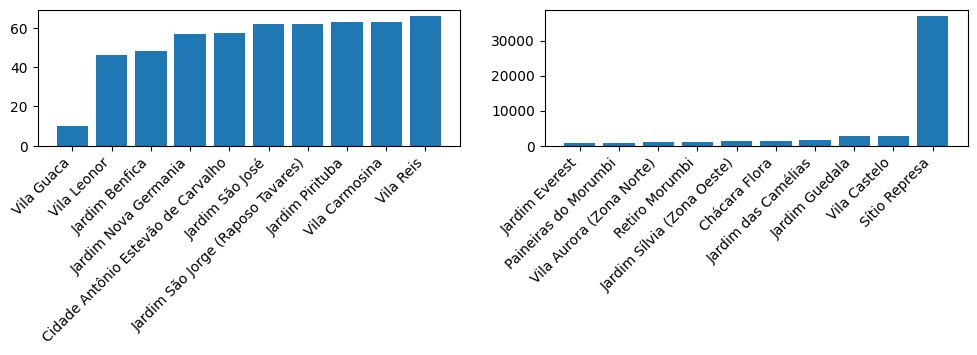

In [26]:
sorted_df_size_per_nbh = df_size_per_nbh.sort_values(by='Size')

plt.rcParams.update({'figure.figsize':(12,2), 'figure.dpi':100})

fig, axes = plt.subplots(1,2)
fig.autofmt_xdate(rotation=45)

print((sorted_df_size_per_nbh).info())

axes[0].bar(sorted_df_size_per_nbh['Neighborhood'].head(10),sorted_df_size_per_nbh['Size'].head(10))
axes[1].bar(sorted_df_size_per_nbh['Neighborhood'].tail(10),sorted_df_size_per_nbh['Size'].tail(10))


## Top 10 Neighborhoods (frequency)

In [27]:
nbh_counts = data.Bairro.value_counts()
nbh_counts

Alto de Pinheiros      369
Jardim Guedala         353
Jardim Paulista        266
Brooklin Paulista      224
Jardim Europa          210
                      ... 
Vila Virginia            1
Vila Boaçava             1
Vila Agueda              1
Jardim Monte Alegre      1
Jardim Ivana             1
Name: Bairro, Length: 697, dtype: int64

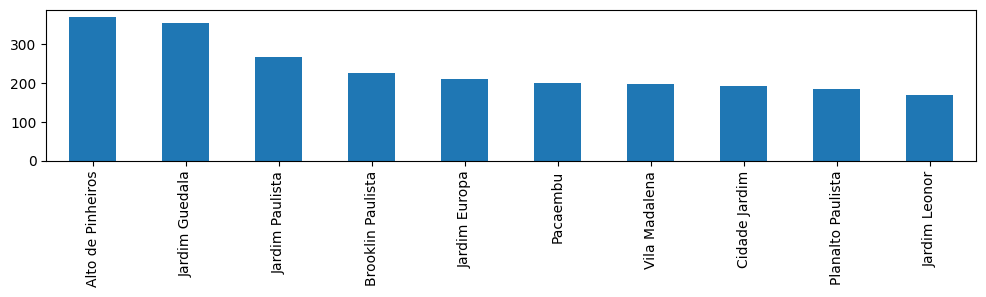

In [28]:
nbh_counts.head(10).plot.bar()


## Which Neighborhood does not have Street Name

In [29]:
null_street = data[data['Rua'].isna()]
null_street_nbh_counts = null_street['Bairro'].value_counts()
total_nbh_counts = data['Bairro'].value_counts()

#difference -> neighborhoods with no street names
difference = total_nbh_counts - null_street_nbh_counts

difference = difference[difference==0]
difference = pd.DataFrame(difference.index)
difference.rename(columns={ 0 : 'Neighborhood'},inplace=True)
difference

,Neighborhood
0,Aricanduva
1,Brasilândia
2,Burgo Paulista
3,Capão Redondo
4,Chácara Tatuapé
...,...
94,Vila São Francisco
95,Vila Sílvia
96,Vila Vasconcelos
97,Vila Virginia


## Value distribution of properties for sale

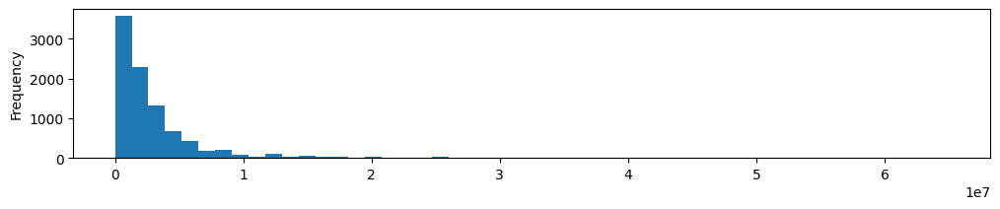

In [30]:
data_sale['Valor_Anuncio'].plot.hist(bins=50)

In [31]:
pd.set_option('display.precision',2)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
data_sale.describe()

,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio
count,9156.00,9156.00,9156.00,9156.00,9156.00
mean,434.42,3.45,3.80,3.96,3052202.96
std,7856.42,1.05,1.97,2.60,3944208.19
min,10.00,1.00,1.00,1.00,13000.00
25%,168.00,3.00,2.00,2.00,890000.00
50%,276.00,3.00,4.00,4.00,1800000.00
75%,450.00,4.00,5.00,5.00,3500000.00
max,750000.00,16.00,40.00,50.00,65000000.00


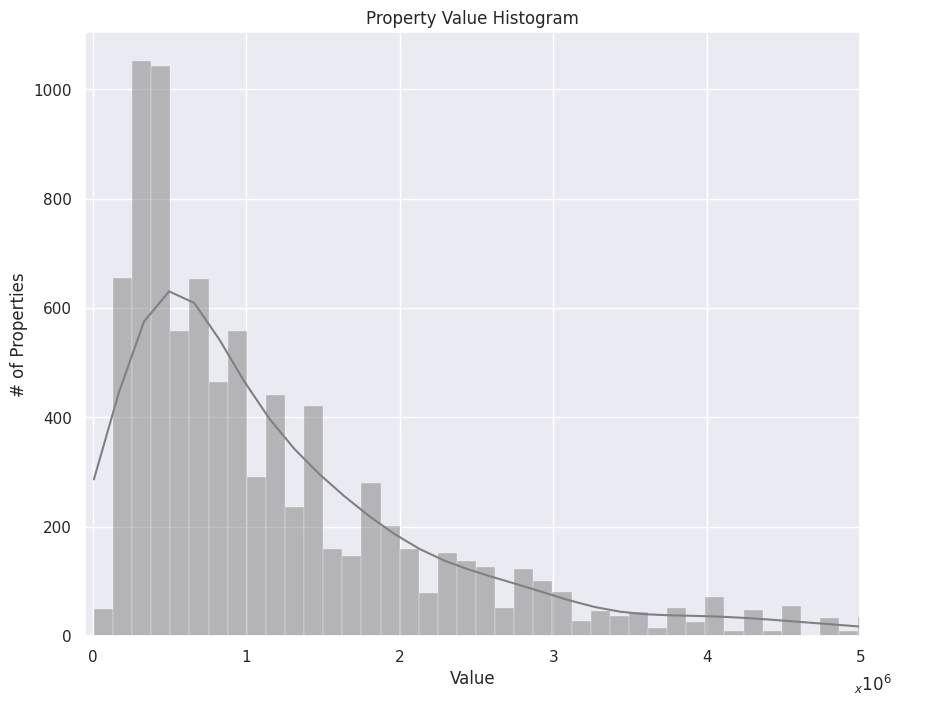

In [32]:
# plotting with seaborn

sns.set()
plt.figure(figsize=(10,8))
ax = sns.histplot(data=data_sale, x = 'Valor_Anuncio', kde=True, color='gray')
ax.set_title('Property Value Histogram')
ax.set_ylabel('# of Properties')
ax.set_xlabel('Value')
ax.annotate(r'$_{x}10^6$', xy=(0.92, 0.04), xycoords='figure fraction')
ax.set_xticklabels(['-1','0','1','2','3','4', '5', '6'])
plt.xlim((-100000,10000000))
plt.show()

## Average Price of the square meter per neighborhood

In [33]:
data_sale['Valor_m2'] = data_sale['Valor_Anuncio'] / data_sale['Metragem']

#mean_value_nbh = price_nbh['Valor_Anuncio'].mean()
#mean_size_nbh = price_nbh['Metragem'].mean()

#avg_price_nbh = mean_value_nbh/mean_size_nbh
#avg_price_nbh

In [34]:
data_sale.groupby(by='Bairro')['Valor_m2'].describe()

,count,mean,std,min,25%,50%,75%,max
Bairro,,,,,,,,
Aclimação,79.00,7656.17,3087.22,3333.33,6000.00,7272.73,8528.14,20000.00
Alto da Boa Vista,8.00,5849.57,1251.64,4352.33,4875.26,5831.93,6711.05,7460.32
Alto da Lapa,80.00,7606.73,2897.23,2123.89,5928.24,7402.60,8857.14,20543.48
Alto da Mooca,20.00,5691.74,2025.24,1987.58,4912.28,5801.28,6728.94,9090.91
Alto de Pinheiros,369.00,11269.98,3939.97,3495.44,8625.00,10703.12,13245.03,25714.29
...,...,...,...,...,...,...,...,...
Vila Água Funda,5.00,4467.13,1532.07,2700.00,3421.05,4111.11,5944.06,6159.42
Água Branca,12.00,7269.11,1671.02,5902.44,6249.57,6584.81,7961.09,11818.18
Água Fria,12.00,5841.10,1278.07,3805.73,4903.12,6076.92,6733.48,7588.24


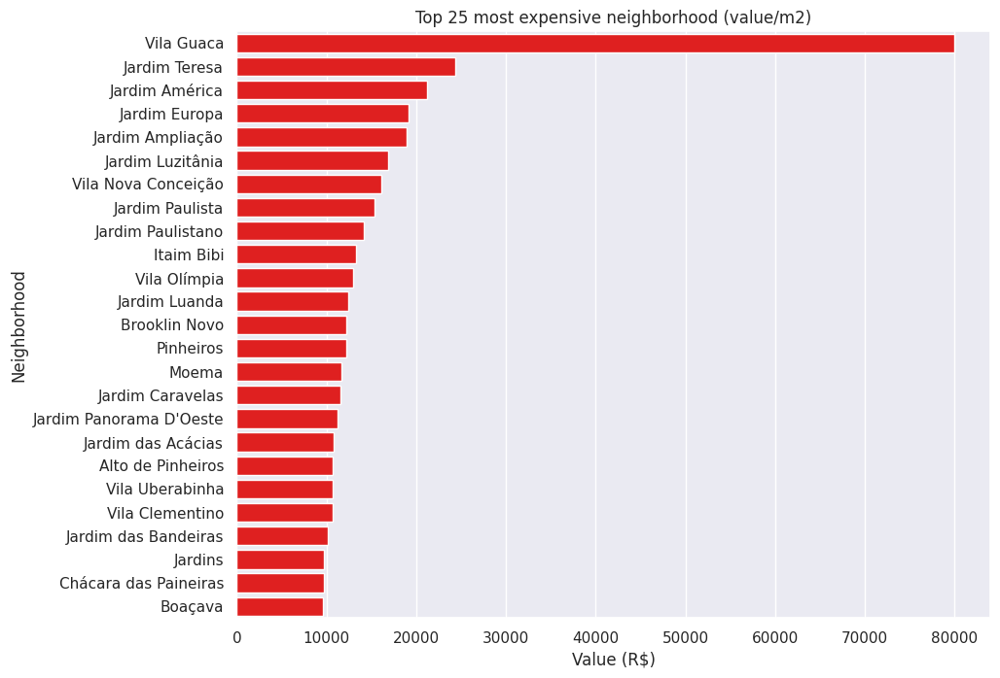

In [35]:
# plotting top 25 most expensive m2

top_expensive_m2 = data_sale.groupby(by='Bairro')['Valor_m2'].median().sort_values(ascending=False).head(25)
top_expensive_m2 = top_expensive_m2.to_frame()
top_expensive_m2.reset_index(inplace=True)

sns.set()
plt.figure(figsize=(10,8))
ax = sns.barplot(data=top_expensive_m2, x ='Valor_m2' ,y='Bairro', color='red')
ax.set_title('Top 25 most expensive neighborhood (value/m2)')
ax.set_ylabel('Neighborhood')
ax.set_xlabel('Value (R$)')
plt.show()


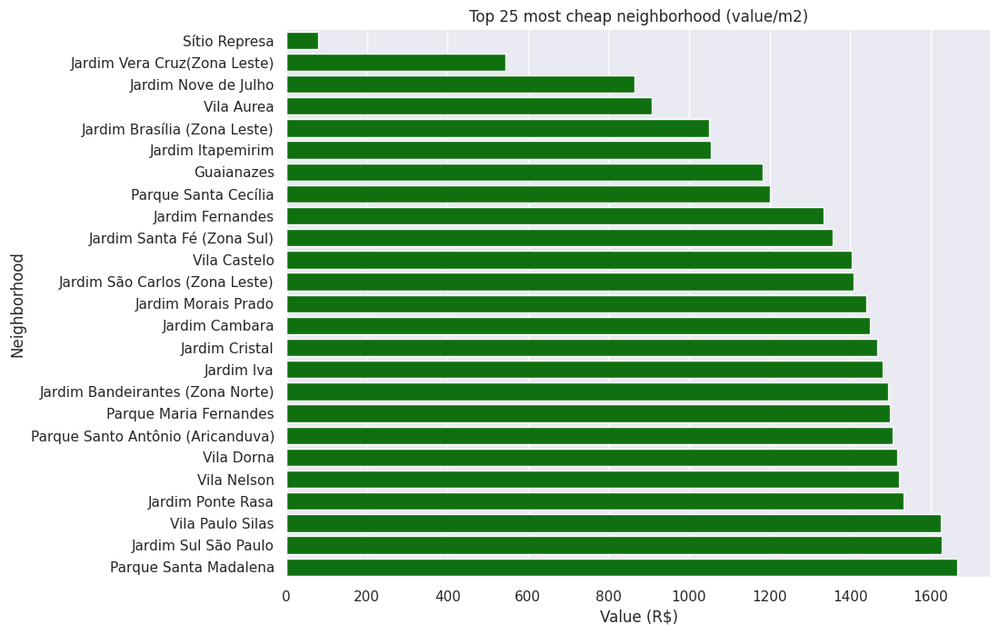

In [36]:
# plotting top 25 most cheap m2

top_cheap_m2 = data_sale.groupby(by='Bairro')['Valor_m2'].median().sort_values().head(25)
top_cheap_m2 = top_cheap_m2.to_frame()
top_cheap_m2.reset_index(inplace=True)

sns.set()
plt.figure(figsize=(10,8))
ax = sns.barplot(data=top_cheap_m2, x ='Valor_m2' ,y='Bairro', color='green')
ax.set_title('Top 25 most cheap neighborhood (value/m2)')
ax.set_ylabel('Neighborhood')
ax.set_xlabel('Value (R$)')
plt.show()


## Top neighborhoods with higher number of properties for sale

In [37]:
top = 10
top_nbh = data_sale['Bairro'].value_counts().head(top).index

df_top_nbh = data_sale.query('Bairro in @top_nbh')
avrg_value_df_top_nbh = (df_top_nbh.groupby(by='Bairro')['Valor_m2'].mean()).to_frame()
avrg_value_df_top_nbh.reset_index(inplace=True)

avrg_value_df_top_nbh['Properties'] = data_sale['Bairro'].value_counts().head(top).values
avrg_value_df_top_nbh.head()


,Bairro,Valor_m2,Properties
0,Alto de Pinheiros,11269.98,369
1,Brooklin Paulista,7264.92,353
2,Cidade Jardim,8563.84,266
3,Jardim Europa,19962.69,224
4,Jardim Guedala,8028.00,210


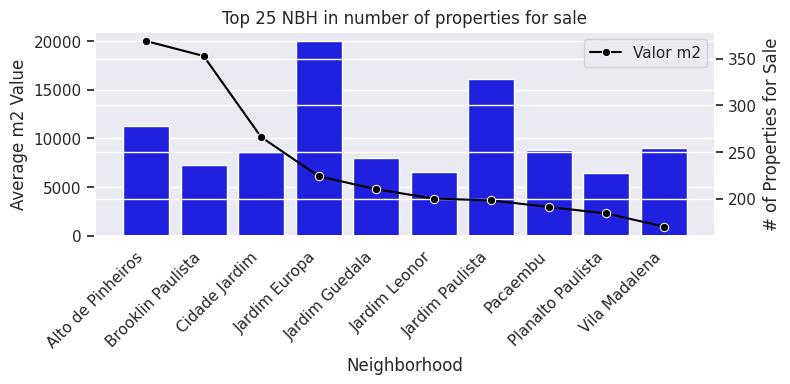

In [38]:
sns.set()
fig, ax1 = plt.subplots(figsize=(8,3))
fig.autofmt_xdate(rotation=45)
#or ax1.tick_params(axis=x, rotation=45)

sns.barplot(data=avrg_value_df_top_nbh, x ='Bairro' ,y='Valor_m2', color='blue',ax=ax1)
ax2 = ax1.twinx()

sns.lineplot(data=avrg_value_df_top_nbh, x='Bairro',y='Properties', color='black', marker='o', ax=ax2)

ax1.set_title('Top 25 NBH in number of properties for sale')
ax1.set_ylabel('Average m2 Value')
ax2.set_ylabel('# of Properties for Sale')
ax1.set_xlabel('Neighborhood')
plt.legend(labels=['Valor m2','Properties'])
plt.show()

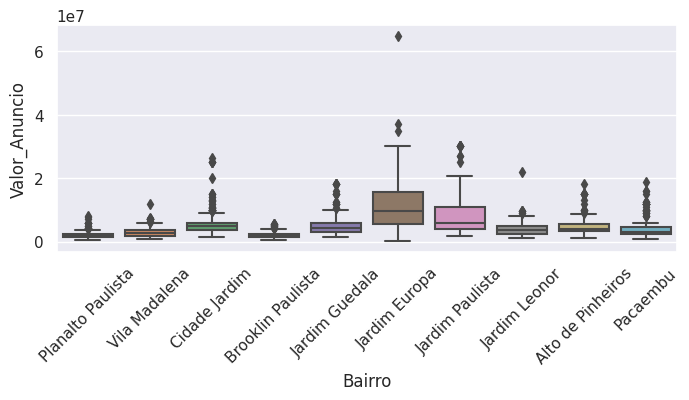

In [39]:
# boxplot - Properties' Value

plt.figure(figsize=(8,3))
ax = sns.boxplot(data=data_sale.query('Bairro in @top_nbh'),x='Bairro',y='Valor_Anuncio')
ax.tick_params(axis='x', rotation=45)
plt.show()

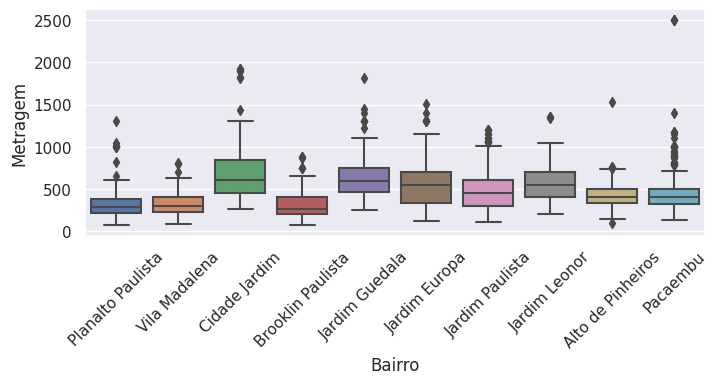

In [40]:
# boxplot - Size (m2)

plt.figure(figsize=(8,3))
ax = sns.boxplot(data=data_sale.query('Bairro in @top_nbh and Metragem < 60000'),x='Bairro',y='Metragem')
ax.tick_params(axis='x', rotation=45)
plt.show()

In [41]:
data_sale.to_csv('data_sale.csv', index=False)



# **Merging Datasets**

In [42]:
# Removing special characters of the Street from data_sale

data_sale = pd.read_csv('data_sale.csv')
data_sale["Rua"].str.extract(r'(^[\w ]+)')[:10]

,0
0,Avenida Itacira
1,Rua Aurelia Perez Alvarez
2,Rua Alba Valdez
3,NaN
4,Rua Tobias Barreto
5,Rua Graham Bell
6,Rua Francisco Paulo
7,Rua Guilherme Valente
8,Rua Sagrada Família
9,Rua Tapaji


In [43]:
data_sale["apenas_rua"] = data_sale["Rua"].str.extract(r'(^[\w ]+)')        # remove special characters, numbers 
data_sale["apenas_rua"] = data_sale["apenas_rua"].str.lower().str.strip()   # normalize
data_sale.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,apenas_rua
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.00,7000.00,avenida itacira
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.00,7459.68,rua aurelia perez alvarez
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.00,3040.00,rua alba valdez
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685000.00,2209.68,NaN
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540000.00,5400.00,rua tobias barreto


In [44]:
# merging data_sale with addr_sp

data_geo = pd.merge(left = data_sale, right = addr_sp[["rua", "cep", "latitude", "longitude"]], how = "left", left_on = "apenas_rua", right_on = "rua").drop_duplicates(subset=data_sale.columns).query("cep > 0")
data_geo

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,apenas_rua,rua,cep,latitude,longitude
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.00,7000.00,avenida itacira,avenida itacira,11443160.00,-23.98,-46.20
5,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.00,7459.68,rua aurelia perez alvarez,rua aurelia perez alvarez,4642020.00,-23.64,-46.69
6,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.00,3040.00,rua alba valdez,rua alba valdez,4845200.00,-23.75,-46.70
7,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685000.00,2209.68,NaN,NaN,18125000.00,-23.53,-47.26
26,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540000.00,5400.00,rua tobias barreto,rua tobias barreto,13474663.00,-22.70,-47.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89956,Avenida Odila,Planalto Paulista,São Paulo,267,3,6,4,1500000.00,5617.98,avenida odila,avenida odila,4058020.00,-23.61,-46.65
89958,Rua Tapuçu,Vila Sofia,São Paulo,95,2,2,2,665000.00,7000.00,rua tapuçu,rua tapuçu,4671185.00,-23.66,-46.69
89959,Rua Guararema,Bosque da Saúde,São Paulo,605,8,7,5,2300000.00,3801.65,rua guararema,rua guararema,13030640.00,-22.92,-47.08
89976,Rua Estero Belaco,Vila da Saúde,São Paulo,205,3,3,6,1050000.00,5121.95,rua estero belaco,rua estero belaco,4145020.00,-23.62,-46.63


In [45]:
data_ibge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18363 entries, 0 to 18362
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Cod_setor              18363 non-null  int64  
 1   Cod_Grandes Regiï¿½es  18363 non-null  int64  
 2   Nome_Grande_Regiao     18363 non-null  object 
 3   Cod_UF                 18363 non-null  int64  
 4   Nome_da_UF             18363 non-null  object 
 5   Cod_meso               18363 non-null  int64  
 6   Nome_da_meso           18363 non-null  object 
 7   Cod_micro              18363 non-null  int64  
 8   Nome_da_micro          18363 non-null  object 
 9   Cod_RM                 18363 non-null  int64  
 10  Nome_da_RM             18363 non-null  object 
 11  Cod_municipio          18363 non-null  int64  
 12  Nome_do_municipio      18363 non-null  object 
 13  Cod_distrito           18363 non-null  int64  
 14  Nome_do_distrito       18363 non-null  object 
 15  Co

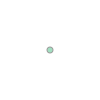

In [46]:
# importing and testing shapely.geometry point

from shapely.geometry import Point
latitude = -23.56 	
longitude = -46.59
Point(longitude, latitude)

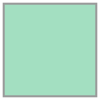

In [47]:
# importing and testing shapely.geometry polygon

from shapely.geometry import Polygon
Polygon([[0, 0], [1, 0], [1, 1], [0, 1], [0, 0]])

In [48]:
# testing if a point is inside a polygon

Polygon([[0, 0], [1, 0], [1, 1], [0, 1], [0, 0]]).contains(Point(0.1,0.9))

True

In [49]:
# adding point type column to "data_geo"

data_geo["Point"] = ""
for i in data_geo.index:
    data_geo["Point"][i] = Point(data_geo["longitude"][i], data_geo["latitude"][i])

data_geo['setor_censo'] = data_geo["Point"].map(
    lambda x: setor_censo_sp.loc[setor_censo_sp.contains(x), 'CD_GEOCODI'].values
).str[0]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [50]:
#saving resulting dataset
data_geo.to_csv('data_geo.csv', index=False)

In [51]:
data_geo = pd.read_csv("data_geo.csv")
data_geo.head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,apenas_rua,rua,cep,latitude,longitude,Point,setor_censo
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.00,7000.00,avenida itacira,avenida itacira,11443160.00,-23.98,-46.20,POINT (-46.2013172 -23.975993),NaN
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.00,7459.68,rua aurelia perez alvarez,rua aurelia perez alvarez,4642020.00,-23.64,-46.69,POINT (-46.6883114 -23.6409612),355030871000023.00
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.00,3040.00,rua alba valdez,rua alba valdez,4845200.00,-23.75,-46.70,POINT (-46.6958895 -23.75299),355030830000050.00
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685000.00,2209.68,NaN,NaN,18125000.00,-23.53,-47.26,POINT (-47.2550228 -23.5310431),NaN
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540000.00,5400.00,rua tobias barreto,rua tobias barreto,13474663.00,-22.70,-47.29,POINT (-47.2944609 -22.6989009),NaN


In [52]:
# Merging data_geo with ibge_data datasets

data_sale_censo = pd.merge(left = data_geo, right = data_ibge, how = "left", left_on = "setor_censo", right_on = "Cod_setor")
data_sale_censo

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,apenas_rua,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,"Avenida Itacira, 255",Planalto Paulista,São Paulo,1000,4,8,6,7000000.00,7000.00,avenida itacira,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Rua Aurelia Perez Alvarez, 42",Jardim dos Estados,São Paulo,496,4,4,4,3700000.00,7459.68,rua aurelia perez alvarez,...,3.13,1.96,7600.44,36778930.17,7890.53,35886906.64,4149.00,26760682.90,6063.92,27502674.90
2,Rua Alba Valdez,Jardim Reimberg,São Paulo,125,4,3,2,380000.00,3040.00,rua alba valdez,...,3.47,3.06,805.13,769188.78,1011.75,757433.42,518.77,426672.78,858.51,414378.88
3,NaN,Jardim Morumbi,São Paulo,310,3,2,4,685000.00,2209.68,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Rua Tobias Barreto, 195",Mooca,São Paulo,100,3,2,2,540000.00,5400.00,rua tobias barreto,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Avenida Odila,Planalto Paulista,São Paulo,267,3,6,4,1500000.00,5617.98,avenida odila,...,2.81,1.60,4249.33,24499871.44,5180.14,25047413.33,2618.76,17705032.31,3977.93,21495997.85
8516,Rua Tapuçu,Vila Sofia,São Paulo,95,2,2,2,665000.00,7000.00,rua tapuçu,...,2.99,1.81,2425.09,6878872.25,2543.80,6913867.79,1561.58,4261814.01,2062.09,4596759.57
8517,Rua Guararema,Bosque da Saúde,São Paulo,605,8,7,5,2300000.00,3801.65,rua guararema,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8518,Rua Estero Belaco,Vila da Saúde,São Paulo,205,3,3,6,1050000.00,5121.95,rua estero belaco,...,2.75,1.50,5650.20,20344622.14,5750.84,20127679.27,3459.68,16021825.60,4362.79,16264378.33


In [53]:
data_sale_censo.to_csv('data_sale_censo.csv', index=False)
data_sale_censo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8520 entries, 0 to 8519
Data columns (total 49 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rua                    5639 non-null   object 
 1   Bairro                 8512 non-null   object 
 2   Cidade                 8520 non-null   object 
 3   Metragem               8520 non-null   int64  
 4   Quartos                8520 non-null   int64  
 5   Banheiros              8520 non-null   int64  
 6   Vagas                  8520 non-null   int64  
 7   Valor_Anuncio          8520 non-null   float64
 8   Valor_m2               8520 non-null   float64
 9   apenas_rua             5639 non-null   object 
 10  rua                    5639 non-null   object 
 11  cep                    8520 non-null   float64
 12  latitude               8520 non-null   float64
 13  longitude              8520 non-null   float64
 14  Point                  8520 non-null   object 
 15  seto

# **Merged Dataset Insights**

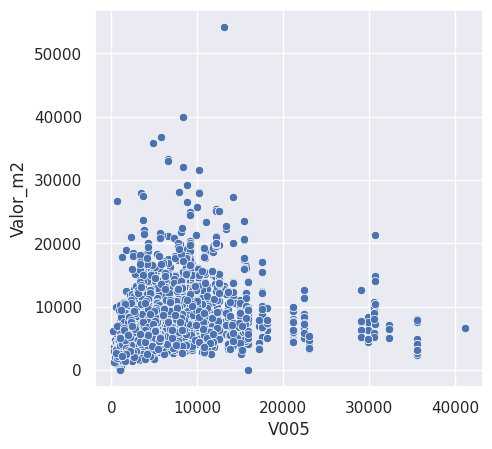

In [54]:
plt.figure(figsize=(5, 5))
sns.scatterplot(data = data_sale_censo, x="V005", y="Valor_m2")

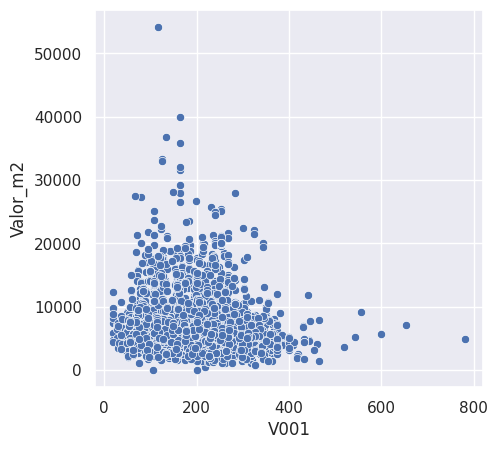

In [55]:
plt.figure(figsize=(5, 5))
sns.scatterplot(data = data_sale_censo, x="V001", y="Valor_m2")

In [56]:
# #data_geo.info()
# #setor_censo_sp.info()
# teste = data_sale_censo.copy()

# teste['Point'] = gpd.GeoSeries.from_wkt(teste['Point'])
# my_geo_df = gpd.GeoDataFrame(teste, geometry='Point')

# print(my_geo_df['Point'])
# my_geo_df.plot()

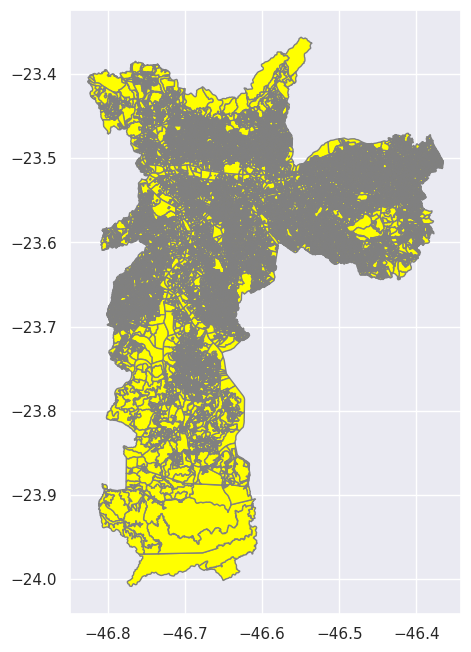

In [57]:
# ploting all census region of SP

#plt.figure(figsize=(8,8))
fig, ax1 = plt.subplots(figsize=(8,8))
setor_censo_sp.plot(ax=ax1, facecolor='yellow', edgecolor='gray')
#ax2 = ax1.twinx()
#my_geo_df.plot(ax=ax1, color='red', markersize=1, marker='.')
#ax.tick_params(axis='x', rotation=45)
#plt.ylim([-24,-23])
#plt.xlim([-47,-46])
plt.show()

#setor_censo_sp[['NM_DISTRIT','geometry']].head(3)
#teste = setor_censo_sp.groupby(by='NM_DISTRIT')['geometry']

#for i in teste:
#  if i[0]=='ALTO DE PINHEIROS':
#    i[1].plot()

#setor_censo_sp['geometry'].iloc[0:2]

## TOP 10 most expensive and cheap properties

In [123]:
top_expensive = data_sale_censo.sort_values('Valor_Anuncio',ascending=False).head(10)
top_cheap = data_sale_censo.sort_values('Valor_Anuncio').head(10)

In [58]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [148]:
# Printing SP map with Folium library'
## Maps not available on GitHub view, please access Google Colab Notebook

import folium

center = [-23.60, -46.66]
# Create a map
m_stamem = folium.Map(location=center, 
                 width=500,height=500,
                 tiles='Stamen Toner', zoom_start=10)

# Display the map
m_stamem

In [149]:
# Adding markers on the location of most expensive and cheap 
## Maps not available on GitHub view, please access Google Colab Notebook

from folium.plugins import MarkerCluster
from folium import Choropleth, Marker

for i in range(0,len(top_expensive)):
  
  folium.Marker(
    location=[top_expensive.iloc[i]['latitude'], top_expensive.iloc[i]['longitude']], 
    popup=str('Neighborhood: '+top_expensive.iloc[i]['Bairro']+' - Value: R$ '+str(top_expensive.iloc[i]['Valor_Anuncio'])),
    icon=folium.Icon(color='red',icon='plus')
  ).add_to(m_stamem)
  
  folium.Marker(
    location=[top_cheap.iloc[i]['latitude'], top_cheap.iloc[i]['longitude']], 
    popup=str('Neighborhood: '+top_cheap.iloc[i]['Bairro']+' - Value: R$ '+str(top_cheap.iloc[i]['Valor_Anuncio'])),
    icon=folium.Icon(color='green',icon='minus')
  ).add_to(m_stamem)

m_stamem

# **Predicting Property Values**

In [62]:
# importing libraries 

import sklearn.metrics as metrics
import sklearn.feature_selection as fs
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd


In [63]:
data_sale_censo = pd.read_csv('data_sale_censo.csv')

data_sale_censo = data_sale_censo[['Rua', 'Bairro', 'Cidade', 'Metragem', 'Quartos', 'Banheiros', 'Vagas', 
                                   'Valor_Anuncio', 'Valor_m2', 'latitude', 'longitude', 'Situacao_setor',
                                   'V001', 'V002', 'V003', 'V004', 'V005', 'V006', 'V007', 'V008', 'V009', 
                                   'V010', 'V011', 'V012']].dropna()
data_sale_censo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3890 entries, 1 to 8519
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Rua             3890 non-null   object 
 1   Bairro          3890 non-null   object 
 2   Cidade          3890 non-null   object 
 3   Metragem        3890 non-null   int64  
 4   Quartos         3890 non-null   int64  
 5   Banheiros       3890 non-null   int64  
 6   Vagas           3890 non-null   int64  
 7   Valor_Anuncio   3890 non-null   float64
 8   Valor_m2        3890 non-null   float64
 9   latitude        3890 non-null   float64
 10  longitude       3890 non-null   float64
 11  Situacao_setor  3890 non-null   float64
 12  V001            3890 non-null   float64
 13  V002            3890 non-null   float64
 14  V003            3890 non-null   float64
 15  V004            3890 non-null   float64
 16  V005            3890 non-null   float64
 17  V006            3890 non-null   f

In [119]:
data_sale_censo.sort_values('Valor_Anuncio').head()

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,latitude,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
48,"Avenida Dom Rodrigo Sanches, 828",Jardim Amália,São Paulo,120,2,2,1,130000.00,1083.33,-23.66,...,3.45,2.60,743.79,535034.66,1095.02,402470.26,486.14,373723.62,943.38,293707.21
1418,"Rua Luís Botta, 1137",Cidade São Mateus,São Paulo,61,1,1,1,147288.00,2414.56,-23.60,...,2.99,1.96,1312.06,1388435.04,1476.07,1319634.89,821.02,1028805.88,1294.87,1008965.77
8254,Rua Victória Simionato,Vila Paranaguá,São Paulo,45,1,1,1,160000.00,3555.56,-23.50,...,3.39,2.00,1201.24,1637463.83,1435.80,1620318.37,837.99,1197382.20,1244.29,1272569.23
256,"Rua Ipomeias, 289",Vila Bela,São Paulo,36,2,1,1,190000.00,5277.78,-23.60,...,2.96,2.56,1116.38,2314345.49,1521.40,2538827.57,920.40,1657066.33,1393.48,1849951.53
6050,Rua Ipomeias,Vila Bela,São Paulo,36,2,1,1,196000.00,5444.44,-23.60,...,2.96,2.56,1116.38,2314345.49,1521.40,2538827.57,920.40,1657066.33,1393.48,1849951.53


## Cleaning dataset for learning improvement

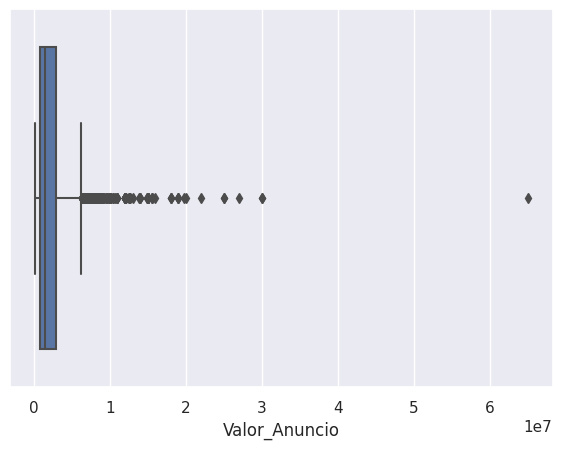

In [64]:
plt.figure(figsize=(7,5))
ax = sns.boxplot(data=data_sale_censo, x='Valor_Anuncio')
plt.show()

In [65]:
data_sale_censo.query('Valor_Anuncio > 30000000 or Valor_Anuncio < 100000')

,Rua,Bairro,Cidade,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,latitude,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
1357,Praça Nicolau Scarpa,Jardim América,São Paulo,1200,4,4,25,65000000.00,54166.67,-23.57,...,3.57,3.01,13131.61,508165993.72,14507.30,541764826.89,7934.91,364776324.15,10168.24,445001716.57


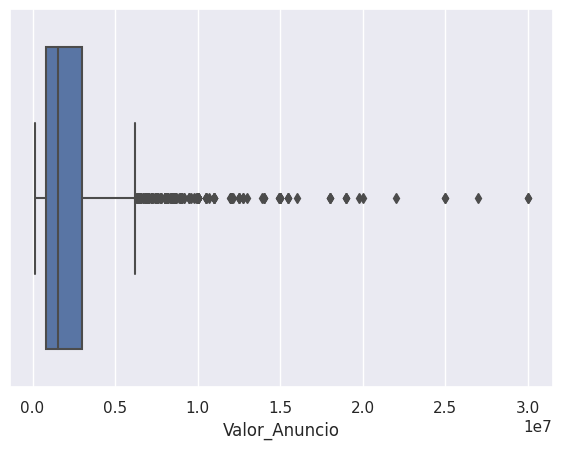

In [66]:
data_sale_censo.drop(data_sale_censo.query('Valor_Anuncio > 30000000 or Valor_Anuncio < 100000').index, inplace=True)
plt.figure(figsize=(7,5))
ax = sns.boxplot(data=data_sale_censo, x='Valor_Anuncio')
plt.show()

In [67]:
data_sale_censo.corr()

,Metragem,Quartos,Banheiros,Vagas,Valor_Anuncio,Valor_m2,latitude,longitude,Situacao_setor,V001,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
Metragem,1.00,0.04,0.06,0.03,0.04,-0.03,-0.00,-0.02,0.03,-0.02,...,0.03,0.02,0.04,0.00,0.03,0.00,0.03,0.00,0.03,0.00
Quartos,0.04,1.00,0.55,0.39,0.41,0.11,-0.03,-0.21,-0.01,-0.20,...,0.16,0.10,0.34,0.14,0.36,0.13,0.34,0.14,0.35,0.12
Banheiros,0.06,0.55,1.00,0.44,0.51,0.22,-0.04,-0.27,-0.03,-0.26,...,0.21,0.09,0.44,0.13,0.44,0.10,0.43,0.13,0.42,0.10
Vagas,0.03,0.39,0.44,1.00,0.47,0.10,-0.05,-0.19,-0.02,-0.22,...,0.21,0.13,0.33,0.11,0.33,0.08,0.32,0.13,0.32,0.09
Valor_Anuncio,0.04,0.41,0.51,0.47,1.00,0.62,0.01,-0.27,-0.02,-0.29,...,0.17,0.13,0.52,0.13,0.51,0.09,0.52,0.16,0.50,0.11
Valor_m2,-0.03,0.11,0.22,0.10,0.62,1.00,0.06,-0.19,-0.04,-0.12,...,-0.15,-0.08,0.28,0.04,0.26,0.02,0.35,0.05,0.29,0.03
latitude,-0.00,-0.03,-0.04,-0.05,0.01,0.06,1.00,0.17,-0.03,-0.02,...,-0.06,0.04,-0.06,-0.10,-0.07,-0.07,-0.05,-0.08,-0.07,-0.06
longitude,-0.02,-0.21,-0.27,-0.19,-0.27,-0.19,0.17,1.00,-0.02,0.33,...,-0.06,0.02,-0.36,-0.10,-0.35,-0.08,-0.38,-0.11,-0.36,-0.08
Situacao_setor,0.03,-0.01,-0.03,-0.02,-0.02,-0.04,-0.03,-0.02,1.00,0.03,...,0.03,0.00,-0.03,-0.01,-0.03,-0.01,-0.04,-0.01,-0.03,-0.01
V001,-0.02,-0.20,-0.26,-0.22,-0.29,-0.12,-0.02,0.33,0.03,1.00,...,-0.26,-0.16,-0.41,-0.12,-0.43,-0.11,-0.39,-0.15,-0.40,-0.12


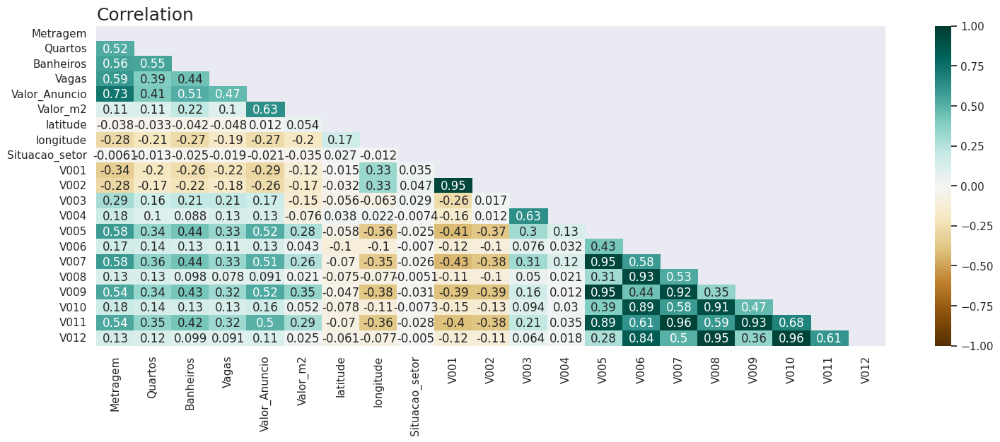

In [68]:
plt.figure(figsize=(18,6))
mask = np.triu(np.ones_like(data_sale_censo.query('Metragem < 5000').corr(),dtype=bool))
heatmap = sns.heatmap(data_sale_censo.query('Metragem < 5000').corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation', fontsize=18, loc='left')
heatmap=heatmap

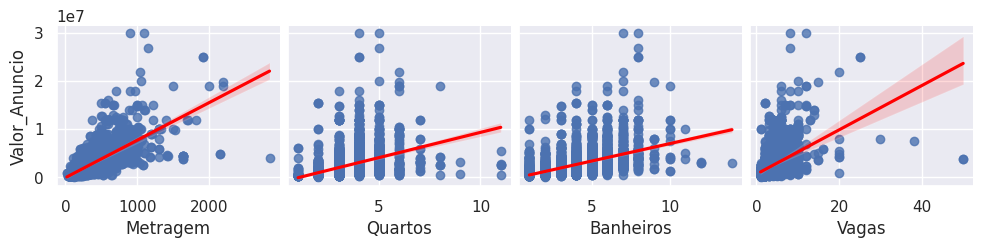

In [69]:
ax = sns.pairplot(data_sale_censo.query('Metragem < 35000'), 
             y_vars='Valor_Anuncio', 
             x_vars=['Metragem','Quartos','Banheiros','Vagas'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

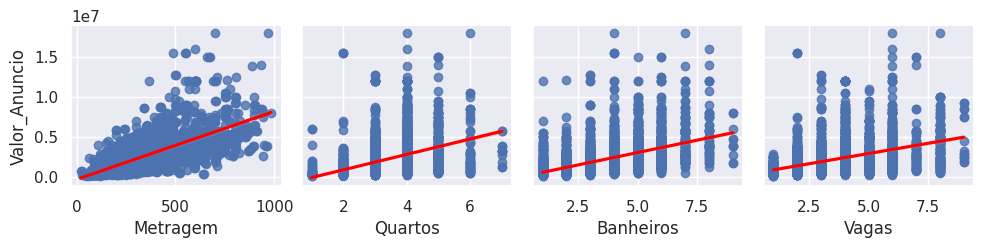

In [70]:
ax = sns.pairplot(data_sale_censo.query('Metragem < 1000 and Vagas < 10 and Quartos < 8 and Banheiros < 10'), 
             y_vars='Valor_Anuncio', 
             x_vars=['Metragem','Quartos','Banheiros','Vagas'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

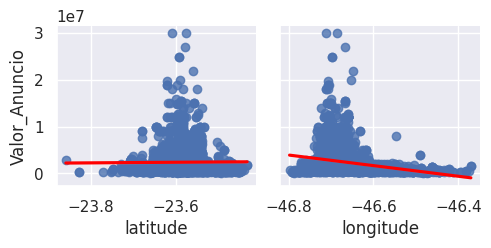

In [71]:
ax = sns.pairplot(data_sale_censo, 
             y_vars='Valor_Anuncio', 
             x_vars=['latitude','longitude'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

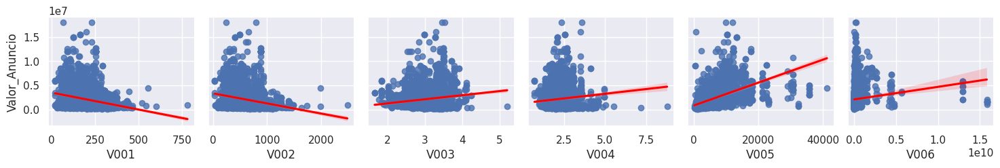

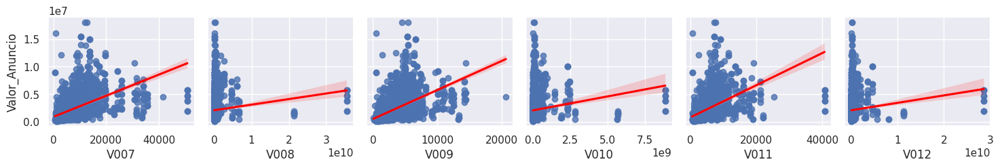

In [72]:
ax = sns.pairplot(data_sale_censo.query('Metragem < 1000 and Vagas < 10 and Quartos < 8 and Banheiros < 10'), 
             y_vars='Valor_Anuncio', 
             x_vars=['V001','V002','V003','V004','V005','V006'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

ax = sns.pairplot(data_sale_censo.query('Metragem < 1000 and Vagas < 10 and Quartos < 8 and Banheiros < 10'), 
             y_vars='Valor_Anuncio', 
             x_vars=['V007','V008','V009','V010','V011','V012'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

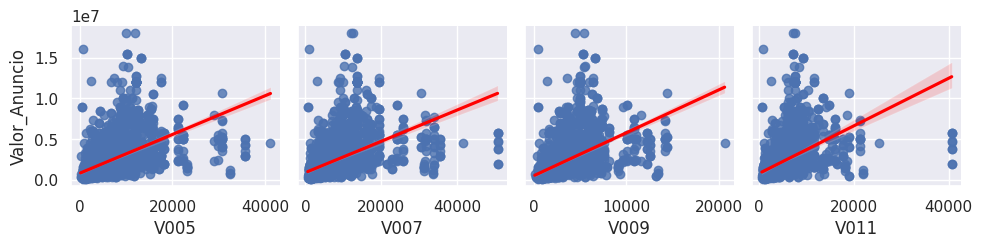

In [73]:
ax = sns.pairplot(data_sale_censo.query('Metragem < 1000 and Vagas < 10 and Quartos < 8 and Banheiros < 10'), 
             y_vars='Valor_Anuncio', 
             x_vars=['V005','V007','V009','V011'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

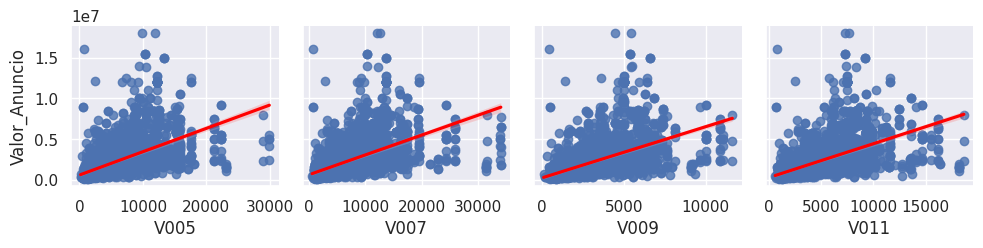

In [74]:
query = 'Metragem < 1000 and Vagas < 10 and Quartos < 8 and Banheiros < 10 and V009 <12000 '
ax = sns.pairplot(data_sale_censo.query(query), 
             y_vars='Valor_Anuncio', 
             x_vars=['V005','V007','V009','V011'],
             kind= 'reg',
             plot_kws = {'line_kws' : {'color':'red'}})
ax=ax

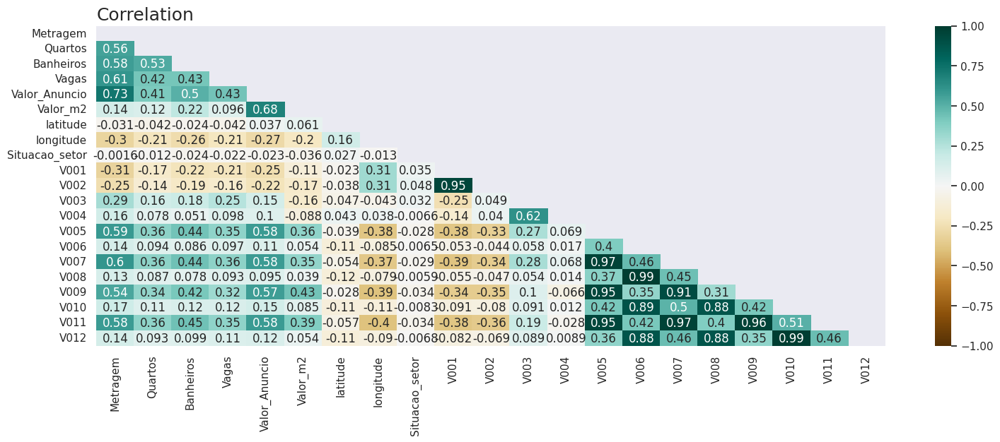

In [75]:
data_clean = data_sale_censo.query(query)

plt.figure(figsize=(18,6))
mask = np.triu(np.ones_like(data_clean.corr(),dtype=bool))
heatmap = sns.heatmap(data_clean.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation', fontsize=18, loc='left')
heatmap=heatmap

## Data organizing

### **Variable - Features**
***
X0 - Metragem

X1 - Metragem, quartos, banheiros, vagas

X2 - latitude, longitude

X3 - Metragem, latitude, longitude

X4 - V005, V007, V009, V011

X5 - Metragem, V005, V007, V009, V011

X6 - Metragem, quartos, banheiros, vagas, latitude, longitude, V005, V007, V009, V011

X7 - All quantitative features (19 features)

In [76]:
X0 = data_clean[['Metragem']]
X1 = data_clean[['Metragem','Quartos','Banheiros','Vagas']]
X2 = data_clean[['latitude', 'longitude']]
X3 = data_clean[['Metragem','latitude', 'longitude']]
X4 = data_clean[['V005','V007','V009','V011']]
X5 = data_clean[['Metragem','V005','V007','V009','V011']]
X6 = data_clean[['Metragem','Quartos','Banheiros','Vagas','latitude', 'longitude','V005','V007','V009','V011']]
X7 = data_clean.drop(['Valor_Anuncio','Valor_m2','Rua','Bairro','Cidade'],axis=1)

Y = data_clean['Valor_Anuncio']

#X_train.head()

## Regression Methods


### Linear Regression

In [77]:
from sklearn.linear_model import LinearRegression, LogisticRegression

def lin_Reg(X_train,Y_train,X_test,Y_test):
  lr = LinearRegression()

  lr.fit(X_train,Y_train)

  train_pred = lr.predict(X_train)
  predict = lr.predict(X_test)

  #df2 = pd.DataFrame({'Y_test':Y_test, 'Prediction':predict})
  #df2.reset_index(inplace=True,drop=True)
  #df2

  #plt.figure(figsize=(6,6))
  #sns.jointplot(x='Y_test', y='Prediction', data=df2, color='m')

  # print('\nLinear Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))
  
  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### SVM Regression

In [78]:
from sklearn import svm

def svm_reg(X_train,Y_train,X_test,Y_test):
  regr = svm.SVR()
  regr.fit(X_train,Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nSVM Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))
  
  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### Multi-Layer Perceptron 

In [79]:
#MLP
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import QuantileTransformer

def mlp_reg(X_train,Y_train,X_test,Y_test):
  regr = make_pipeline(
    QuantileTransformer(),
    MLPRegressor(random_state=1, max_iter=10000, solver='lbfgs'),
    )
  #regr = MLPRegressor(random_state=1, max_iter=10000, solver='lbfgs')
  regr.fit(X_train, Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nMLP Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))
  
  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### Stochastic Gradient Descent

In [80]:
# Stochastic Gradient Descent
from sklearn.linear_model import SGDRegressor

def gd_reg(X_train,Y_train,X_test,Y_test):

  regr = SGDRegressor(max_iter=1000000)
  regr.fit(X_train, Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nStochastic Gradient Descent Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))

  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)



### ARD Regression

In [81]:
#ARD regression
from sklearn.linear_model import ARDRegression

def ard_reg(X_train,Y_train,X_test,Y_test):
  regr = ARDRegression(n_iter=1000, tol=0.0001)
  regr.fit(X_train, Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nARD Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))

  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### Gradient Boosting 

In [82]:
# Gradient boosting
from sklearn.ensemble import GradientBoostingRegressor

def gb_reg(X_train,Y_train,X_test,Y_test, testing=True):
  params = {
      "n_estimators": 100,
      "max_depth": 6,
      "min_samples_split": 5,
      "learning_rate": 0.1,
      "loss": "squared_error",
  }

  gbr = GradientBoostingRegressor(**params)
  gbr.fit(X_train, Y_train)

  predict = gbr.predict(X_test)
  train_pred = gbr.predict(X_train)

  # print('\nGradient Boosting Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))
  if(testing==True):
    return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict), predict
  else:
    return predict

### Random Forest

In [83]:
#random forest
from sklearn.ensemble import RandomForestRegressor

def rf_reg(X_train,Y_train,X_test,Y_test):
  regr = RandomForestRegressor()
  regr.fit(X_train, Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nRandom Forest Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))

  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### ADA Boost Regression

In [84]:
# ADA Boost
from sklearn.ensemble import AdaBoostRegressor

def adab_reg(X_train,Y_train,X_test,Y_test):
  regr = AdaBoostRegressor()
  regr.fit(X_train, Y_train)
  predict = regr.predict(X_test)
  train_pred = regr.predict(X_train)

  # print('\nADA Boost Regression')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))

  return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict)

### Voting Regressor (GB + RF)

In [85]:
#voting regressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor


def vot_reg(X_train,Y_train,X_test,Y_test, testing=True):
  #GB
  params = {
      "n_estimators": 100,
      "max_depth": 6,
      "min_samples_split": 5,
      "learning_rate": 0.1,
      "loss": "squared_error",
  }
  gbr = GradientBoostingRegressor(**params)
  
  #RF
  rfr = RandomForestRegressor()

  #MLP
  mlp = make_pipeline(
    QuantileTransformer(),
    MLPRegressor(random_state=1, max_iter=10000, solver='lbfgs'),
    )

  #Voting
  er = VotingRegressor([('GB', gbr), ('RF', rfr)]) #, ('MLP',mlp)])

  er.fit(X_train, Y_train)
  predict = er.predict(X_test)
  train_pred = er.predict(X_train)

  # print('\nVoting Regression (GB + RF)')
  # print('R2_score Train = {}\nMSE Train = {}'.format(metrics.r2_score(Y_train,train_pred),metrics.mean_squared_error(Y_train,train_pred)))
  # print('R2_score Test = {}\nMSE Test = {}'.format(metrics.r2_score(Y_test,predict),metrics.mean_squared_error(Y_test,predict)))

  if(testing==True):
    return metrics.r2_score(Y_train,train_pred), metrics.r2_score(Y_test,predict), metrics.mean_squared_error(Y_train,train_pred), metrics.mean_squared_error(Y_test,predict), predict
  else:
    return predict

## Testing

### Testing function: training and testing for each regression model

In [86]:
#Testing implementation
## SVM and Gradiend Descent were removed - data not fitted

from sklearn.preprocessing import StandardScaler

def test_regression(X,Y,norm=False):
  
  #split into train/test sets
  X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.25, random_state=42)

  #normalization
  if(norm!=False):
    scaler = StandardScaler().fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)

  #creates DF for results
  results = pd.DataFrame(columns=['Method', 'R2_Train', 'R2_Test', 'MSE_Train', 'MSE_Test'])

  a,b,c,d = lin_Reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'Linear Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  # a,b,c,d = svm_reg(X_train,Y_train,X_test,Y_test)
  # tests = {'Method':'SVM Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  # results = results.append(tests, ignore_index=True)

  a,b,c,d = mlp_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'MLP Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  a,b,c,d,e = gb_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'Gradient Boosting Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  a,b,c,d = ard_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'ARD Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  a,b,c,d = rf_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'Random Forest Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  # a,b,c,d = gd_reg(X_train,Y_train,X_test,Y_test)
  # tests = {'Method':'Gradient Descent Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  # results = results.append(tests, ignore_index=True)

  a,b,c,d = adab_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'ADA Boost Regression', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  a,b,c,d,e = vot_reg(X_train,Y_train,X_test,Y_test)
  tests = {'Method':'Voting Regression (GB + RF)', 'R2_Train':a,'R2_Test':b, 'MSE_Train':c,'MSE_Test':d}
  results = results.append(tests, ignore_index=True)

  return results


In [87]:
# plotting results
# results - DataFrame with results
# plt_r2 - plot r2 results
# plt_mse - plot mse results
# if both are false, show dataframe as table

def plot_reg_results(results, test_set, plt_r2=False, plt_mse=False):
  left_lim = 0
  right_lim = 0.85
  if(plt_r2==False and plt_mse==False):
    print(results)
    return
  if plt_r2==True:
    plt.figure(figsize=(8,4))
    ax = plt.subplot(2,1,1)
    ax.set_xlim(right=right_lim, left = left_lim)
    ax.set_title('R2 Score - Results '+test_set, loc='left', fontsize=18)
    sns.barplot(data=results, y='Method', x='R2_Test')
    # ax = plt.subplot(2,1,2)
    # ax.set_xlim(right=right_lim, left = left_lim)
    # sns.barplot(data=results, y='Method', x='R2_Train')
    # plt.subplots_adjust(left=None, bottom=0.7, right=None, top=2, wspace=None, hspace=None)
    ax=ax
  if plt_mse==True:
    plt.figure(figsize=(8,4))
    ax2 = plt.subplot(2,1,1)
    ax2.set_xlim(right=right_lim, left = left_lim)
    ax2.set_title('MSE - Results '+test_set, loc='left', fontsize=18)
    sns.barplot(data=results, y='Method', x='R2_Test')
    # ax2 = plt.subplot(2,1,2)
    # ax2.set_xlim(right=right_lim, left = left_lim)
    # sns.barplot(data=results, y='Method', x='R2_Train')
    # plt.subplots_adjust(left=None, bottom=0.7, right=None, top=2, wspace=None, hspace=None)
    ax2=ax2


### Training and Testing for X0 to X7

#### Without input Normalization

In [88]:
# Calculating without input normalization
X0_res = test_regression(X0,Y)
X1_res = test_regression(X1,Y)
X2_res = test_regression(X2,Y)
X3_res = test_regression(X3,Y)
X4_res = test_regression(X4,Y)
X5_res = test_regression(X5,Y)
X6_res = test_regression(X6,Y)
X7_res = test_regression(X7,Y)


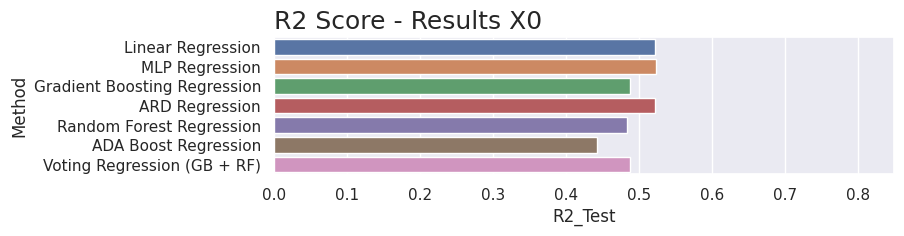

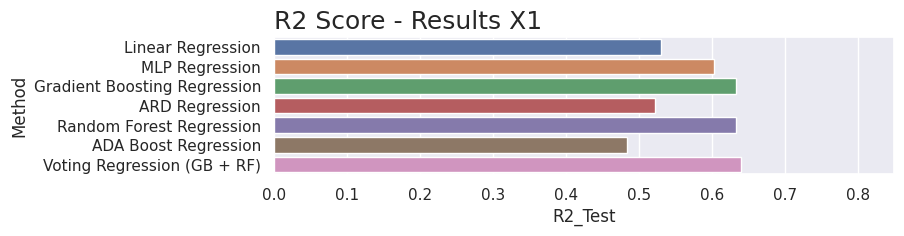

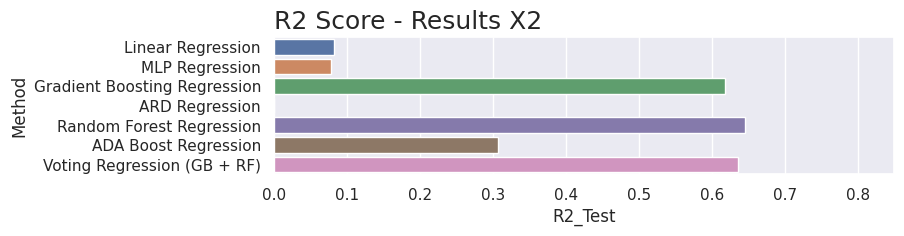

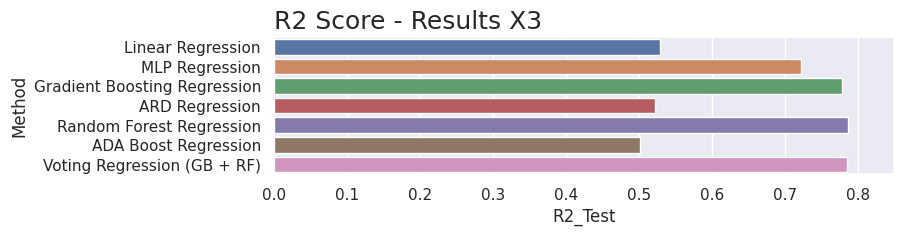

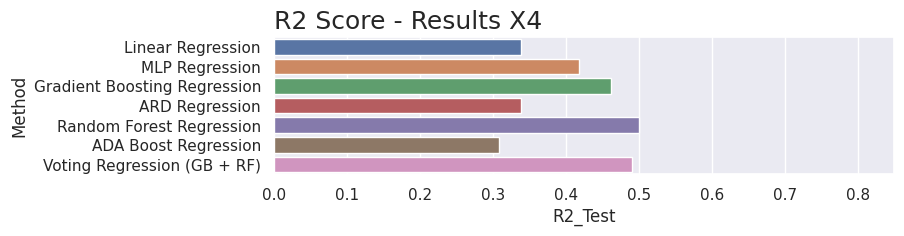

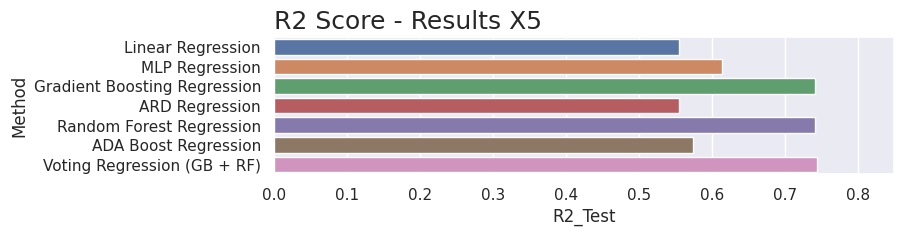

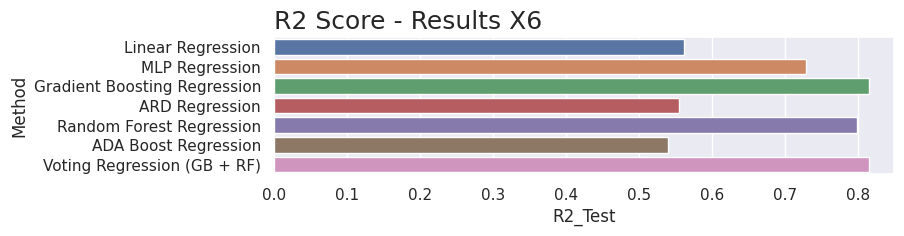

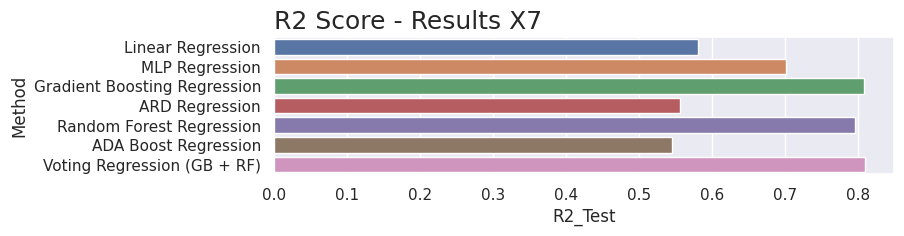

In [89]:
#plotting results
plot_reg_results(X0_res,'X0' ,True, False)
plot_reg_results(X1_res,'X1' ,True, False)
plot_reg_results(X2_res,'X2' ,True, False)
plot_reg_results(X3_res,'X3' ,True, False)
plot_reg_results(X4_res,'X4' ,True, False)
plot_reg_results(X5_res,'X5' ,True, False)
plot_reg_results(X6_res,'X6' ,True, False)
plot_reg_results(X7_res,'X7' ,True, False)



#### With input normalization 

In [90]:
# Calculating with input normalization
X0_norm = test_regression(X0,Y,True)
X1_norm = test_regression(X1,Y,True)
X2_norm = test_regression(X2,Y,True)
X3_norm = test_regression(X3,Y,True)
X4_norm = test_regression(X4,Y,True)
X5_norm = test_regression(X5,Y,True)
X6_norm = test_regression(X6,Y,True)
X7_norm = test_regression(X7,Y,True)


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


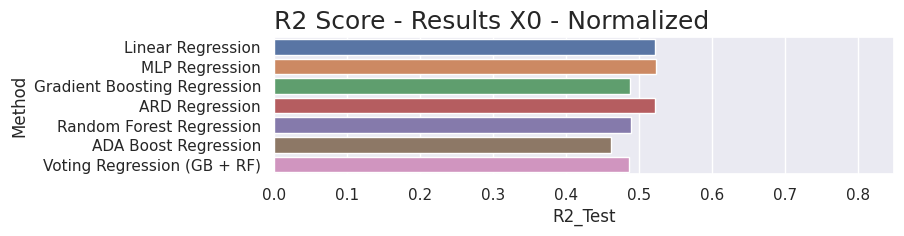

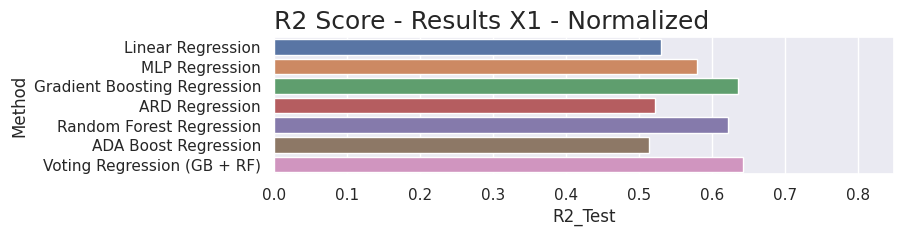

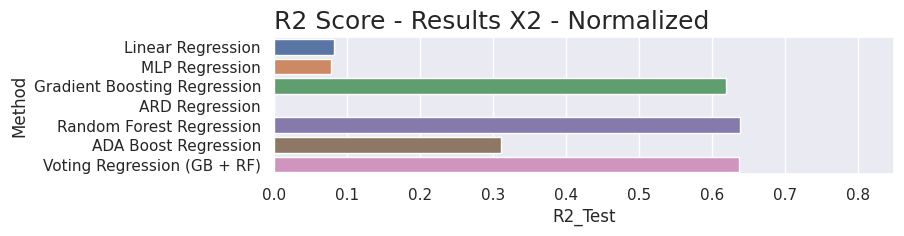

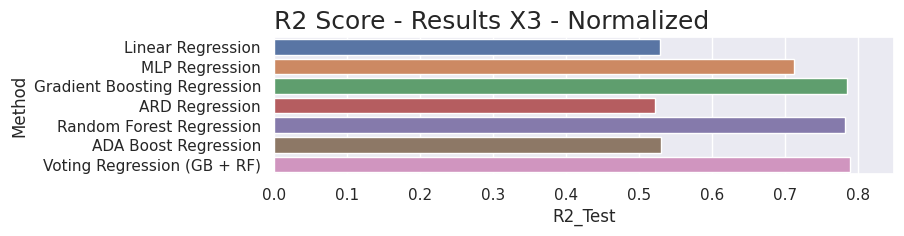

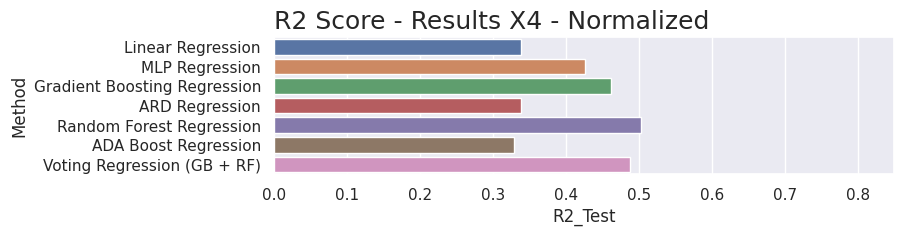

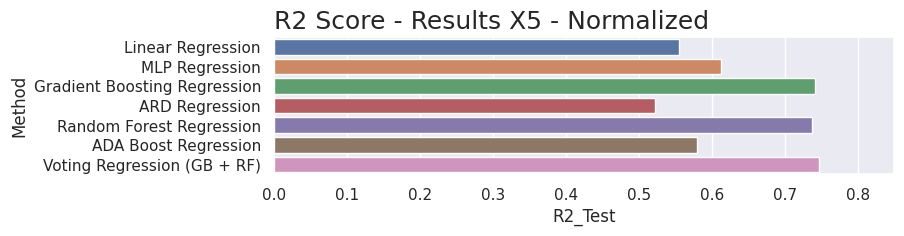

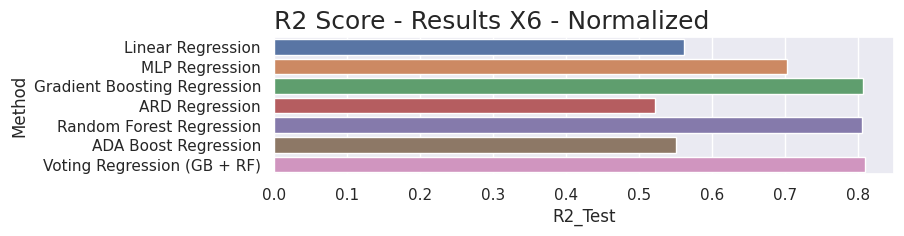

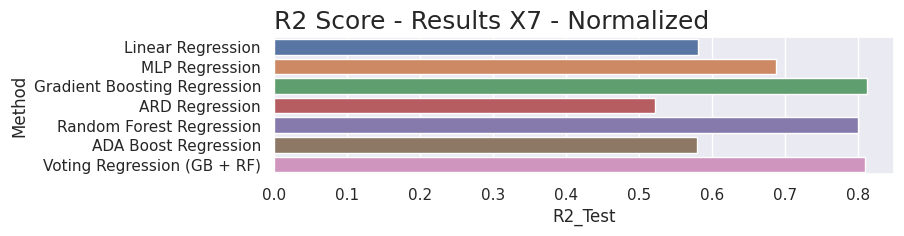

In [91]:
#plotting results
plot_reg_results(X0_norm,'X0 - Normalized' ,True, False)
plot_reg_results(X1_norm,'X1 - Normalized' ,True, False)
plot_reg_results(X2_norm,'X2 - Normalized' ,True, False)
plot_reg_results(X3_norm,'X3 - Normalized' ,True, False)
plot_reg_results(X4_norm,'X4 - Normalized' ,True, False)
plot_reg_results(X5_norm,'X5 - Normalized' ,True, False)
plot_reg_results(X6_norm,'X6 - Normalized' ,True, False)
plot_reg_results(X7_norm,'X7 - Normalized' ,True, False)


#### Training and Testing Conclusions:

**Non-normalized input data**

1. The difference is small, but X6 selection fared better than X7.
2. Best Method: Gradient Boosting
3. R2_Score: 0.812640

**Normalized input data:**

Same results, but X3 achieved good results:

1. Using only Size, latitude, and longitude features;
2. Best method: Voting Regression (GB + RF)
3. R2_score: 0.792696



## Testing with Real World data

In [92]:
# Grouping results for visualization

rw_results = pd.DataFrame(columns=['Test_Case','Method','X_set','Normalization','Expected_Value','Predicted_Value','Difference'])

### Testing With Normalized input data + Voting Regression

#### Test Case 1

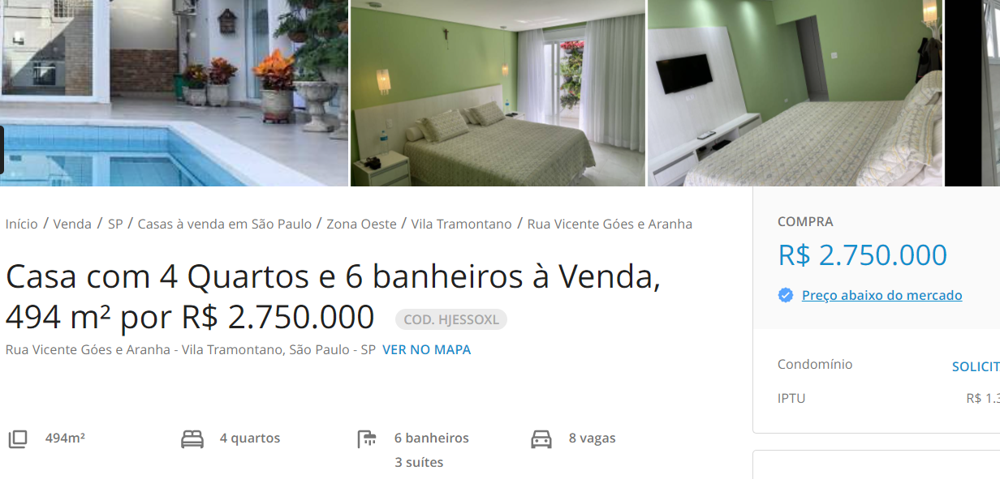

https://www.vivareal.com.br/imovel/casa-4-quartos-vila-tramontano-zona-oeste-sao-paulo-com-garagem-494m2-venda-RS2750000-id-2541337689/


In [93]:
#Real test
#https://www.vivareal.com.br/imovel/casa-4-quartos-vila-tramontano-zona-oeste-sao-paulo-com-garagem-494m2-venda-RS2750000-id-2541337689/
# R$ 2750000
lat = -23.61527849899721
long= -46.70876651615866
size = 494
value = 2750000

data = {'Metragem':size, 'latitude':lat, 'longitude':long}
X = pd.DataFrame(columns=['Metragem', 'latitude', 'longitude'])
X = X.append(data, ignore_index=True)
X.values

X_train, X_test, Y_train, Y_test = train_test_split(X3,Y, test_size=0.25, random_state=42)

# print((X_train))
# print((X))

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X = scaler.transform(X)

# print((X_train[:5]))
# print((X))

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':1,'Method':'Voting','Normalization':'Yes', 'X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':1,'Method':'GB','Normalization':'Yes', 'X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)




Results - Voting (GB + RF): 
Real Value: R$ 2750000
Predicted Value: R$ 3215216.26
Difference: R$ -465216.26
Precision: 0.8553079412456069

Results - Gradient Boosting
Real Value: R$ 2750000
Predicted Value: R$ 3108085.84
Difference: R$ -358085.84
Precision: 0.8847889477853031




#### Test Case 2

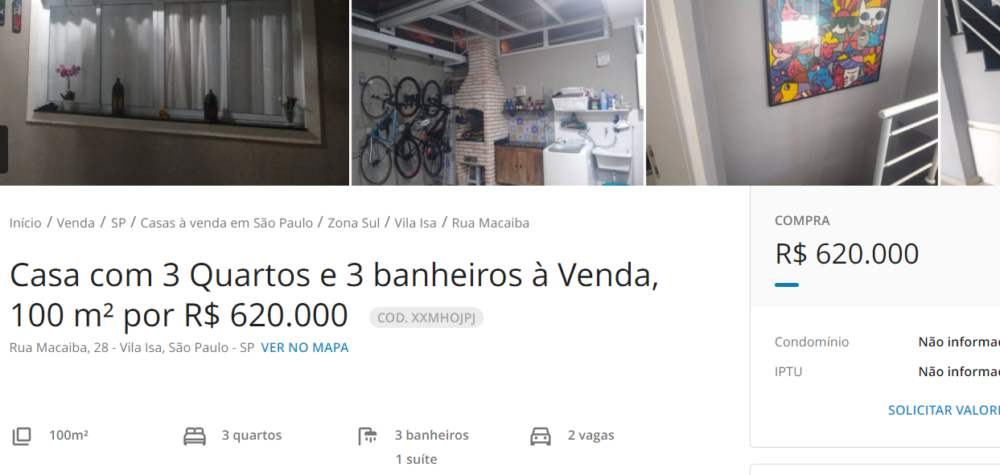

https://www.vivareal.com.br/imovel/casa-3-quartos-vila-isa-zona-sul-sao-paulo-com-garagem-100m2-venda-RS620000-id-2512585711/


In [94]:
#Real test
# https://www.vivareal.com.br/imovel/casa-3-quartos-vila-isa-zona-sul-sao-paulo-com-garagem-100m2-venda-RS620000-id-2512585711/
# R$ 620.000,00
lat = -23.66873503009184
long= -46.69130915153534
size = 100
value = 620000

data = {'Metragem':size, 'latitude':lat, 'longitude':long}
X = pd.DataFrame(columns=['Metragem', 'latitude', 'longitude'])
X = X.append(data, ignore_index=True)
X.values

X_train, X_test, Y_train, Y_test = train_test_split(X3,Y, test_size=0.25, random_state=42)

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':2,'Method':'Voting','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':2,'Method':'GB','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 620000
Predicted Value: R$ 645475.64
Difference: R$ -25475.64
Precision: 0.9605319884728725

Results - Gradient Boosting
Real Value: R$ 620000
Predicted Value: R$ 662116.11
Difference: R$ -42116.11
Precision: 0.9363916549319424




#### Test Case 3

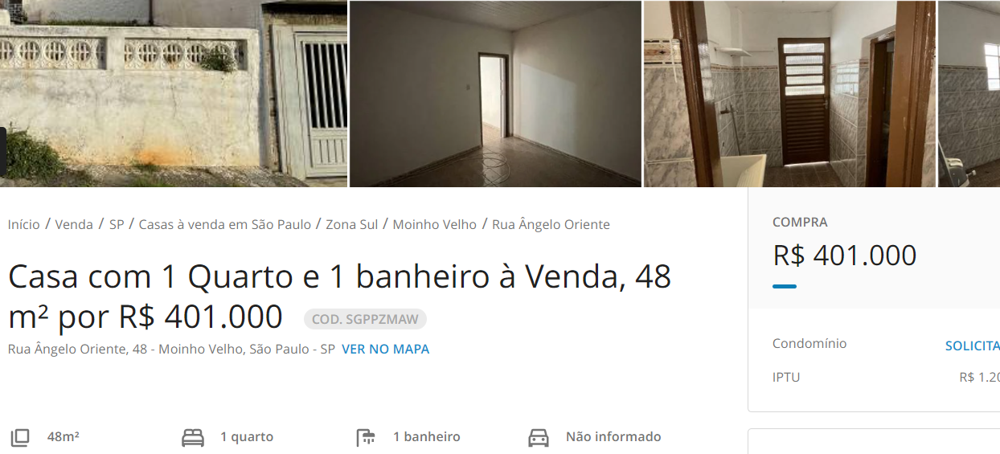

https://www.vivareal.com.br/imovel/casa-1-quartos-moinho-velho-zona-sul-sao-paulo-48m2-venda-RS401000-id-2565950387/


In [95]:
#Real test
#https://www.vivareal.com.br/imovel/casa-1-quartos-moinho-velho-zona-sul-sao-paulo-48m2-venda-RS401000-id-2565950387/
# R$ 620.000,00
lat = -23.494439690731525
long= -46.70712066034071
size = 48
value = 401000

data = {'Metragem':size, 'latitude':lat, 'longitude':long}
X = pd.DataFrame(columns=['Metragem', 'latitude', 'longitude'])
X = X.append(data, ignore_index=True)
X.values

X_train, X_test, Y_train, Y_test = train_test_split(X3,Y, test_size=0.25, random_state=42)

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':3,'Method':'Voting','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':3,'Method':'GB','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 401000
Predicted Value: R$ 497780.59
Difference: R$ -96780.59
Precision: 0.8055758059991852

Results - Gradient Boosting
Real Value: R$ 401000
Predicted Value: R$ 503891.19
Difference: R$ -102891.19
Precision: 0.7958067296235125




#### Test Case 4

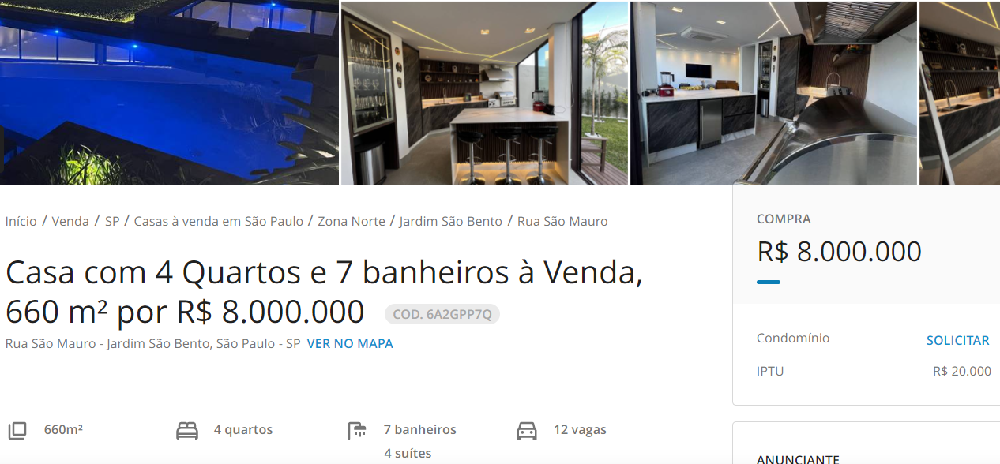

https://www.vivareal.com.br/imovel/casa-4-quartos-jardim-sao-bento-zona-norte-sao-paulo-com-garagem-660m2-venda-RS8000000-id-2564690358/


In [96]:
#Real test
# https://www.vivareal.com.br/imovel/casa-4-quartos-jardim-sao-bento-zona-norte-sao-paulo-com-garagem-660m2-venda-RS8000000-id-2564690358/
# R$ 8.000.000,00
lat = -23.50447648908102
long= -46.645119902668576
size = 660
value = 8000000

data = {'Metragem':size, 'latitude':lat, 'longitude':long}
X = pd.DataFrame(columns=['Metragem', 'latitude', 'longitude'])
X = X.append(data, ignore_index=True)
X.values

X_train, X_test, Y_train, Y_test = train_test_split(X3,Y, test_size=0.25, random_state=42)

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':4,'Method':'Voting','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':4,'Method':'GB','Normalization':'Yes','X_set':'X3',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 8000000
Predicted Value: R$ 4127605.73
Difference: R$ 3872394.27
Precision: 1.938169612919885

Results - Gradient Boosting
Real Value: R$ 8000000
Predicted Value: R$ 3981782.94
Difference: R$ 4018217.06
Precision: 2.009150202446746




### Testing With Non-Normalized input data

#### Test Case 1

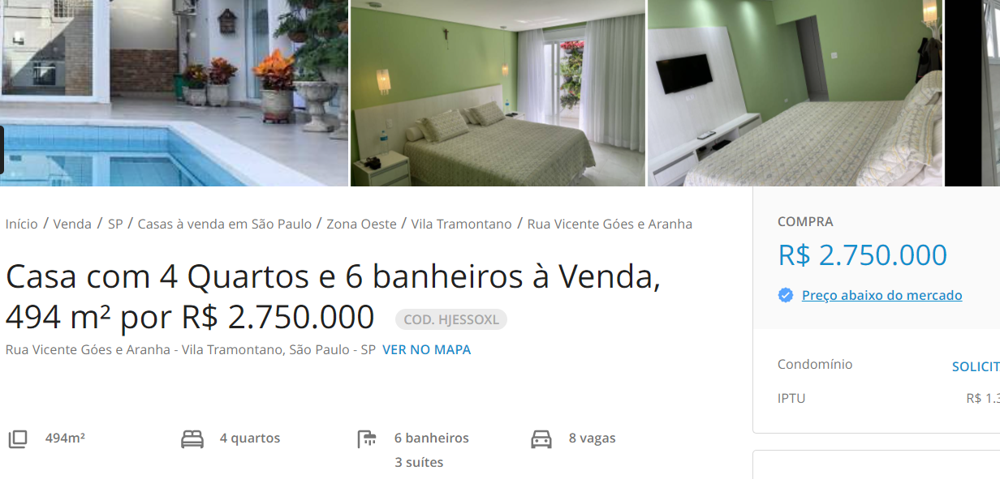

https://www.vivareal.com.br/imovel/casa-4-quartos-vila-tramontano-zona-oeste-sao-paulo-com-garagem-494m2-venda-RS2750000-id-2541337689/


In [97]:
#data_clean['Bairro'].str.contains('Vila Tramontano').value_counts()
data_clean.query('Bairro == "Vila Tramontano" and Rua == "Rua Vicente Góes e Aranha" ')[['Rua','V005','V007','V009','V011']]

,Rua,V005,V007,V009,V011
2841,Rua Vicente Góes e Aranha,15004.92,18685.38,9620.39,14052.64
2868,Rua Vicente Góes e Aranha,15004.92,18685.38,9620.39,14052.64


In [98]:
#Real test
#https://www.vivareal.com.br/imovel/casa-4-quartos-vila-tramontano-zona-oeste-sao-paulo-com-garagem-494m2-venda-RS2750000-id-2541337689/
# R$ 2.750.000
lat = -23.61527849899721
long= -46.70876651615866
size = 494
value = 2750000
bedrooms = 4
car_parking = 8
bathrooms = 6
v005 = 15004.92
v007 = 18685.38
v009 = 9620.39
v011 = 14052.64

data = {'Metragem':size, 
        'latitude':lat, 
        'longitude':long,
        'Quartos': bedrooms,
        'Banheiros': bathrooms,
        'Vagas': car_parking,
        'V005': v005,
        'V007': v007,
        'V009': v009,
        'V011': v011}
X = pd.DataFrame(columns=['Metragem','Quartos','Banheiros','Vagas','latitude', 'longitude','V005','V007','V009','V011'])
X = X.append(data, ignore_index=True)

X_train, X_test, Y_train, Y_test = train_test_split(X6,Y, test_size=0.25, random_state=42)

# scaler = StandardScaler().fit(X_train)
# X_train = scaler.transform(X_train)
# X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':1,'Method':'Voting','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':1,'Method':'GB','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 2750000
Predicted Value: R$ 3741778.19
Difference: R$ -991778.19
Precision: 0.7349446868201452

Results - Gradient Boosting
Real Value: R$ 2750000
Predicted Value: R$ 3547466.39
Difference: R$ -797466.39
Precision: 0.775201142920483




#### Test Case 2

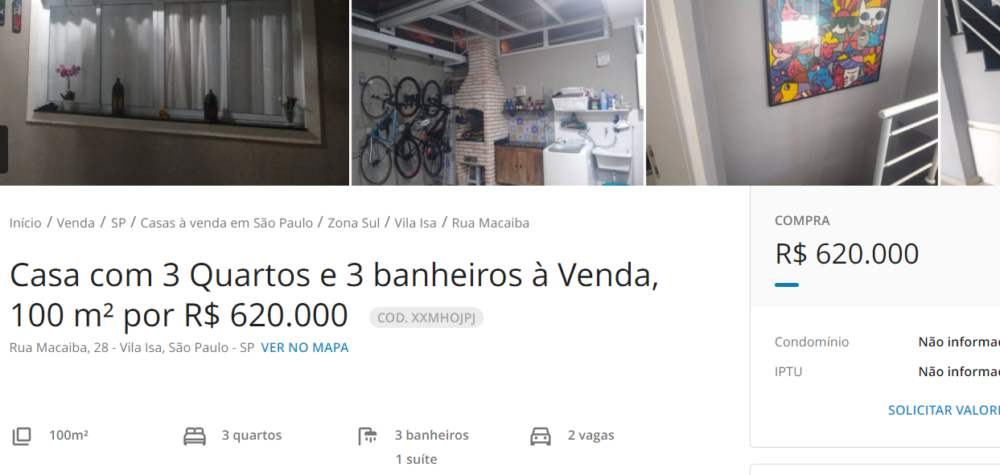

https://www.vivareal.com.br/imovel/casa-3-quartos-vila-isa-zona-sul-sao-paulo-com-garagem-100m2-venda-RS620000-id-2512585711/


In [99]:
#data_clean['Bairro'].str.contains('Vila Isa').value_counts()
data_clean.query('Bairro == "Vila Isa" ')[['Rua','V005','V007','V009','V011']]

,Rua,V005,V007,V009,V011
1884,Rua Doutor Aldo de Assis Dias,1731.72,2053.46,1125.99,1762.55
1974,Rua Doutor Aldo de Assis Dias,1731.72,2053.46,1125.99,1762.55
7878,Rua Beijuí,1731.72,2053.46,1125.99,1762.55
8345,Rua Paraim,1731.72,2053.46,1125.99,1762.55


In [100]:
#Real test
# https://www.vivareal.com.br/imovel/casa-3-quartos-vila-isa-zona-sul-sao-paulo-com-garagem-100m2-venda-RS620000-id-2512585711/
# R$ 620.000,00
lat = -23.66873503009184
long= -46.69130915153534
size = 100
value = 620000
bedrooms = 3
car_parking = 2
bathrooms = 3
v005 = 1731.72
v007 = 2053.46	
v009 = 1125.99	
v011 = 1762.55

data = {'Metragem':size, 
        'latitude':lat, 
        'longitude':long,
        'Quartos': bedrooms,
        'Banheiros': bathrooms,
        'Vagas': car_parking,
        'V005': v005,
        'V007': v007,
        'V009': v009,
        'V011': v011}
X = pd.DataFrame(columns=['Metragem','Quartos','Banheiros','Vagas','latitude', 'longitude','V005','V007','V009','V011'])
X = X.append(data, ignore_index=True)

X_train, X_test, Y_train, Y_test = train_test_split(X6,Y, test_size=0.25, random_state=42)

# scaler = StandardScaler().fit(X_train)
# X_train = scaler.transform(X_train)
# X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':2,'Method':'Voting','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':2,'Method':'GB','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 620000
Predicted Value: R$ 607379.82
Difference: R$ 12620.18
Precision: 1.0207780693141897

Results - Gradient Boosting
Real Value: R$ 620000
Predicted Value: R$ 636528.93
Difference: R$ -16528.93
Precision: 0.9740327120717042




#### Test Case 3

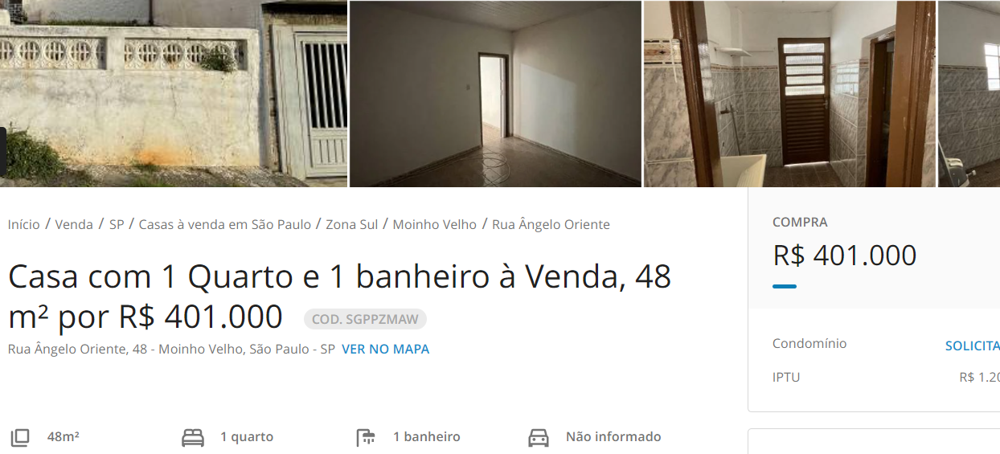

https://www.vivareal.com.br/imovel/casa-1-quartos-moinho-velho-zona-sul-sao-paulo-48m2-venda-RS401000-id-2565950387/


In [101]:
#data_clean[data_clean['Bairro'].str.contains('Moinho Velho')]
data_clean.query('Bairro == "Vila Moinho Velho" ')[['Rua','V005','V007','V009','V011']]

,Rua,V005,V007,V009,V011
4734,Rua Drava,2038.99,2336.13,1312.05,1907.24
4794,Rua Drava,2038.99,2336.13,1312.05,1907.24
6211,Rua Tito Prates da Fonseca,582.90,1015.60,504.08,853.70


In [102]:
#Real test
#https://www.vivareal.com.br/imovel/casa-1-quartos-moinho-velho-zona-sul-sao-paulo-48m2-venda-RS401000-id-2565950387/
# R$ 401.000,00
lat = -23.494439690731525
long= -46.70712066034071
size = 48
value = 401000
bedrooms = 1
car_parking = 0
bathrooms = 1
v005 = 2038.99
v007 = 2336.13
v009 = 1312.05	
v011 = 1907.24

data = {'Metragem':size, 
        'latitude':lat, 
        'longitude':long,
        'Quartos': bedrooms,
        'Banheiros': bathrooms,
        'Vagas': car_parking,
        'V005': v005,
        'V007': v007,
        'V009': v009,
        'V011': v011}
X = pd.DataFrame(columns=['Metragem','Quartos','Banheiros','Vagas','latitude', 'longitude','V005','V007','V009','V011'])
X = X.append(data, ignore_index=True)

X_train, X_test, Y_train, Y_test = train_test_split(X6,Y, test_size=0.25, random_state=42)

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':3,'Method':'Voting','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':3,'Method':'GB','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 401000
Predicted Value: R$ 432888.34
Difference: R$ -31888.34
Precision: 0.9263358768221847

Results - Gradient Boosting
Real Value: R$ 401000
Predicted Value: R$ 515652.21
Difference: R$ -114652.21
Precision: 0.7776559320864735




#### Test Case 4

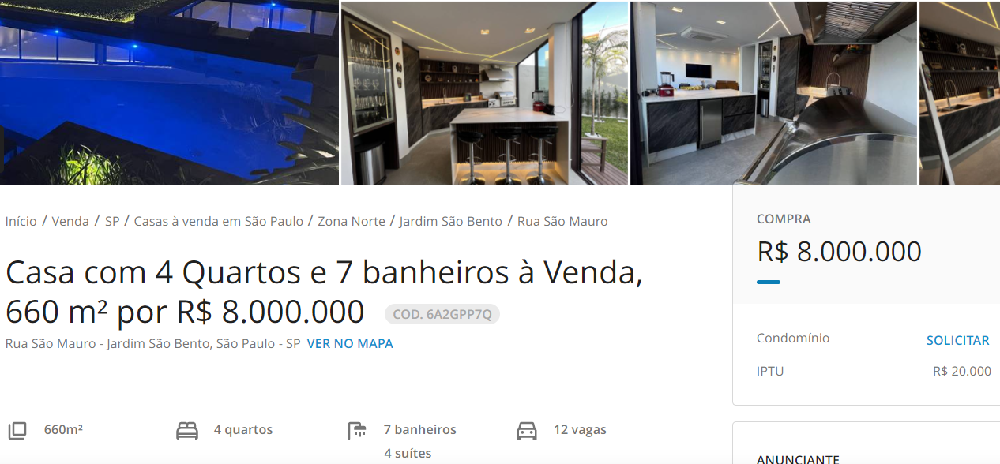

https://www.vivareal.com.br/imovel/casa-4-quartos-jardim-sao-bento-zona-norte-sao-paulo-com-garagem-660m2-venda-RS8000000-id-2564690358/


In [103]:
#data_clean['Bairro'].str.contains('Jardim São Bento').value_counts()
data_clean.query('Bairro == "Jardim São Bento"')[['Rua','V005','V007','V009','V011']]

,Rua,V005,V007,V009,V011
875,"Rua Maestro Antão Fernandes, , 135",6078.73,6997.10,2829.04,4501.11
8170,Rua Maestro Antão Fernandes,6078.73,6997.10,2829.04,4501.11
8288,Rua Maestro Antão Fernandes,6078.73,6997.10,2829.04,4501.11
8472,Rua Frei Mauro Teixeira,3349.41,5842.57,1810.37,3630.85
8506,Rua Frei Mauro Teixeira,3349.41,5842.57,1810.37,3630.85


In [104]:
#Real test
# https://www.vivareal.com.br/imovel/casa-4-quartos-jardim-sao-bento-zona-norte-sao-paulo-com-garagem-660m2-venda-RS8000000-id-2564690358/
# R$ 8.000.000,00
lat = -23.50447648908102
long= -46.645119902668576
size = 660
value = 8000000
bedrooms = 4
car_parking = 12
bathrooms = 7
v005 = 6078.73
v007 = 6997.1
v009 = 2829.04
v011 = 4501.11

data = {'Metragem':size, 
        'latitude':lat, 
        'longitude':long,
        'Quartos': bedrooms,
        'Banheiros': bathrooms,
        'Vagas': car_parking,
        'V005': v005,
        'V007': v007,
        'V009': v009,
        'V011': v011}
X = pd.DataFrame(columns=['Metragem','Quartos','Banheiros','Vagas','latitude', 'longitude','V005','V007','V009','V011'])
X = X.append(data, ignore_index=True)
X.values

X_train, X_test, Y_train, Y_test = train_test_split(X6,Y, test_size=0.25, random_state=42)

# scaler = StandardScaler().fit(X_train)
# X_train = scaler.transform(X_train)
# X = scaler.transform(X)

pred = vot_reg(X_train,Y_train,X,[value],False)
pred2 = gb_reg(X_train,Y_train,X,[value],False)

print('Results - Voting (GB + RF): ')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred[0],2)}')
print(f'Difference: R$ {round(value-pred[0],2)}')
print(f'Precision: {value/round(pred[0],2)}\n')
rw_results = rw_results.append({'Test_Case':4,'Method':'Voting','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred[0],'Difference':abs(value-pred[0])},
                  ignore_index=True)

print('Results - Gradient Boosting')
print(f'Real Value: R$ {value}')
print(f'Predicted Value: R$ {round(pred2[0],2)}')
print(f'Difference: R$ {round(value-pred2[0],2)}')
print(f'Precision: {value/round(pred2[0],2)}\n\n')
rw_results = rw_results.append({'Test_Case':4,'Method':'GB','Normalization':'No','X_set':'X6',
                   'Expected_Value':value,'Predicted_Value':pred2[0],'Difference':abs(value-pred2[0])},
                  ignore_index=True)


Results - Voting (GB + RF): 
Real Value: R$ 8000000
Predicted Value: R$ 4060416.23
Difference: R$ 3939583.77
Precision: 1.9702413611916825

Results - Gradient Boosting
Real Value: R$ 8000000
Predicted Value: R$ 3915751.04
Difference: R$ 4084248.96
Precision: 2.043030805145365




## Results Summarization

In [105]:
rw_results

,Test_Case,Method,X_set,Normalization,Expected_Value,Predicted_Value,Difference
0,1,Voting,X3,Yes,2750000,3215216.26,465216.26
1,1,GB,X3,Yes,2750000,3108085.84,358085.84
2,2,Voting,X3,Yes,620000,645475.64,25475.64
3,2,GB,X3,Yes,620000,662116.11,42116.11
4,3,Voting,X3,Yes,401000,497780.59,96780.59
5,3,GB,X3,Yes,401000,503891.19,102891.19
6,4,Voting,X3,Yes,8000000,4127605.73,3872394.27
7,4,GB,X3,Yes,8000000,3981782.94,4018217.06
8,1,Voting,X6,No,2750000,3741778.19,991778.19
9,1,GB,X6,No,2750000,3547466.39,797466.39


As shown by the results table, 4 test cases were performed (a detailed description of each Test Case is presented in the previous section). In short:

* Test Case 1 - Value R\$ 2.750.000,00 
* Test Case 2 - Value R\$ 620.000,00
* Test Case 3 - Value R\$ 401.000,00
* Test Case 4 - Value R\$ 8.000.000,00

The tests were performed with the Methods Gradient Boosting Regression (GB) and Voting Regression, which uses a combination of GB and Random Forest regression.  

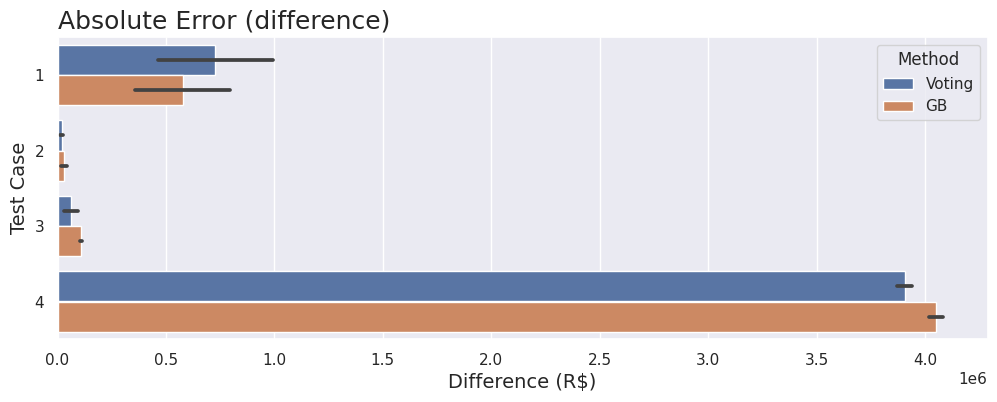

In [115]:
plt.figure(figsize=(12,4))
ax = sns.barplot(data=rw_results,y='Test_Case',x='Difference',hue='Method',orient='h')
ax.set_xlabel('Difference (R$)',fontsize=14)
ax.set_ylabel('Test Case',fontsize=14)
ax.set_title('Absolute Error (difference)', fontsize=18, loc='left')
ax=ax

As observed, both methods achieved similar results for the real data performed tests. This graphic represents the average difference between expected and predicted values, as the methods were tested with both X3 and X6 feature sets. 

Test Case 4 presented the worst results for both methods, and Test Case 1 was the second-worst. Both Test Cases have value in common: both are the most expensive tested properties. For further investigation, a Histogram of the Property Value feature on the training dataset is shown:



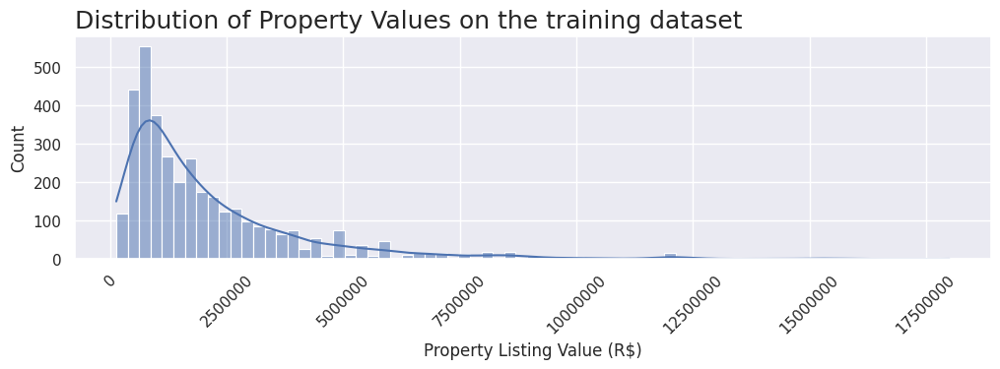

In [113]:
plt.figure(figsize=(12,3))
ax = sns.histplot(data=data_clean, x='Valor_Anuncio',kde=True)
ax.ticklabel_format(useOffset=False, style='plain')
plt.xticks(rotation=45)
ax.set_xlabel('Property Listing Value (R$)',fontsize=12)
ax.set_ylabel('Count',fontsize=12)
ax.set_title('Distribution of Property Values on the training dataset', fontsize=18, loc='left')
ax=ax

As observed, most properties of the training dataset have values below R\$ 2.500.00,00. Thus the prediction of properties with higher values should be impaired.

*Possible solutions:*
1. Increase the training dataset with more valuable properties.
2. Apply up or downsampling methods to mitigate the dataset imbalance.
3. Split training dataset, constructing two predictors, one for values below R\$ 2.500.000,00 and another for properties with values above this threshold. 

The following plot shows the difference between the predicted and expected values per Test Case for both methods, separated by X3 and X6 test sets. 

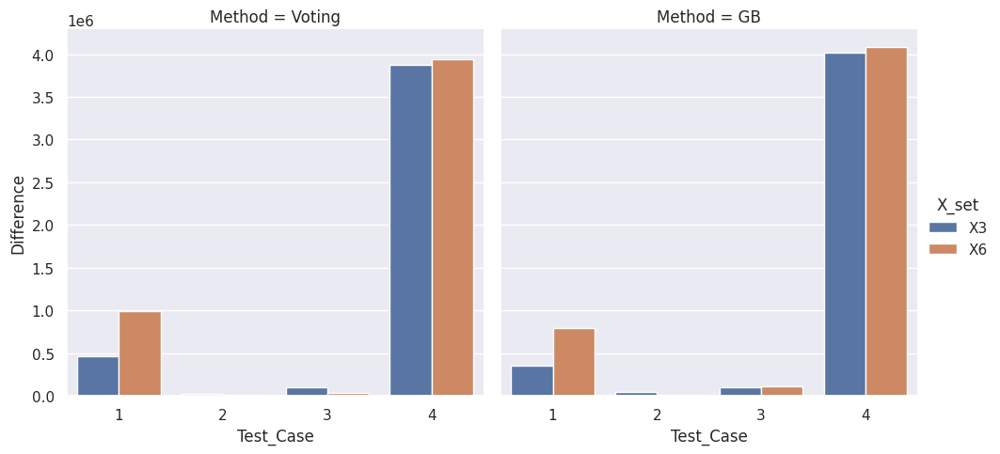

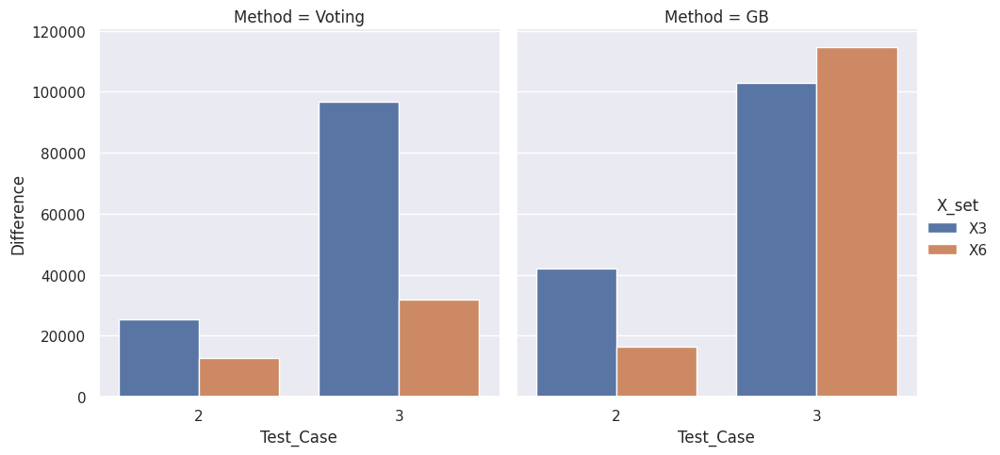

In [108]:
ax = sns.catplot(data=rw_results,x='Test_Case',y='Difference',hue='X_set', col='Method', kind='bar')
ax = sns.catplot(data=rw_results.query('Test_Case != 4 and Test_Case!=1'),x='Test_Case',y='Difference',hue='X_set', col='Method', kind='bar')

> Remembering: X3 and X6 are the feature sets that presented the best R2 Score results in the training phase, being composed by:

> * X3 = [ Size, Latitude, Longitude]
* X6 = [ Size, Bedrooms, Bathrooms, Car Parking, latitude, longitude, V005, V007, V009, V011 ]

> The V's features represent quantitative data collected on the IBGE dataset, representing (according to the dataset [dictionary](https://drive.google.com/file/d/1WVTqfKtHOOk5X1AWaSOn6NLaO7cix2m4/view), page 45):

> * V005 - Value of the average monthly nominal income of persons responsible for permanent private households (with and without income)
* V007 - Value of the average monthly nominal income of persons responsible for permanent private households (with income)
* V009 - Value of the average monthly nominal income of people aged 10 years and over (with and without income)
* V011 - Value of the average monthly nominal income of people aged 10 years and over (with income)

The first two plots show information regarding the 4 Test Cases, while the last two show only values regarding Test Cases 2 and 3 (improved visualization).

A general visual comparison shows a slight difference between Voting and GB. However, by analyzing **Test Cases 2 and 3** separately, the **Voting Regression** appears to be **more accurate** than GB when **using X6 feature set** on properties with smaller values.

For properties with higher values (**Test cases 1 and 4**), the **error increases** for both methods **when using the X6 feature set** compared to X3. This information supports the inference that higher value properties distribution has different behavior. Thus, creating two regression methods may be the next step for accuracy improvement. 

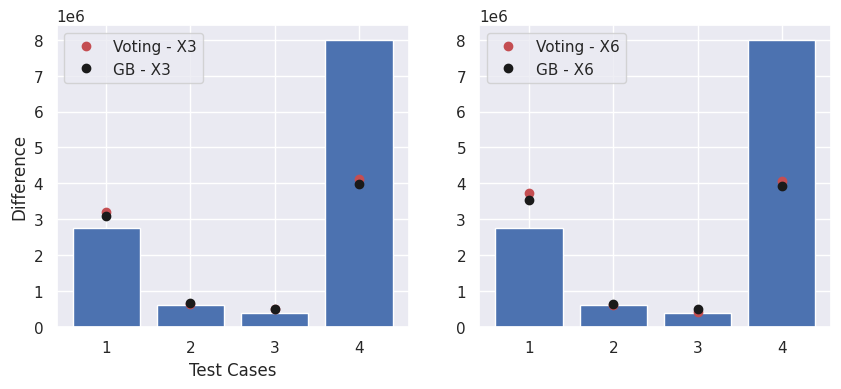

In [109]:
teste = rw_results.query('X_set == "X3" and Method=="Voting"')
teste.reset_index(inplace=True,drop=True)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.bar(teste['Test_Case'],teste['Expected_Value'])
plt.plot(teste['Test_Case'], teste['Predicted_Value'],'ro')

teste = rw_results.query('X_set == "X3" and Method=="GB"')
teste.reset_index(inplace=True,drop=True)

plt.plot(teste['Test_Case'], teste['Predicted_Value'],'ko')
plt.legend(['Voting - X3', 'GB - X3'])
plt.ylabel('Difference')
plt.xlabel('Test Cases')

plt.subplot(1,2,2)

teste = rw_results.query('X_set != "X3" and Method=="Voting"')
teste.reset_index(inplace=True,drop=True)

plt.bar(teste['Test_Case'],teste['Expected_Value'])
plt.plot(teste['Test_Case'], teste['Predicted_Value'],'ro')

teste = rw_results.query('X_set != "X3" and Method=="GB"')
teste.reset_index(inplace=True,drop=True)
plt.plot(teste['Test_Case'], teste['Predicted_Value'],'ko')
plt.legend(['Voting - X6', 'GB - X6'])

plt=plt

Finally, these bar plots show the expected values (bars) and the predicted values for both tested methods and the X feature set.

As observed, for Test Cases 1 to 3, both methods overestimated the property value. 

Regarding Test Case 4, the prediction underestimated the property value, and the absolute error (difference) was around R\$ 4.000.000,00. Although more tests are needed to conclude it, this result may indicate that the tested models have a superior threshold of property value prediction.

# **Conclusion and Final Insights**
***

1.   Dataset was split, with 75% being used on training and 25% on testing. In this test, Gradient Boosting (GB) achieved better results using the X6 feature set, achieving a 0.81 R2 Value. Voting Regression (GB + Random Forest) reached a similar effect, with 0.79 R2 Value using the X3 feature set (fewer features).
2.   In real data testing, although Gradient Boosting and Voting Regression methods achieved similar results, the Voting approach fared better when predicting average values (Test cases 2 and 3). 
3.   X6 feature set was more effective in generating predictions for both methods in Test Cases 2 and 3, while the X3 feature set was more effective in Test Cases 1 and 4.
4.   X6 may describe better the property value distribution on the average. However, it is composed of more features, increasing computational complexity.
5.   In systems with limited resources, X3 could be used, as it presents relatively good prediction outcomes with only 3 features, size, latitude, and longitude. 

*Next steps on improving the prediction performance:*
1. Increase the training dataset with more valuable properties.
2. Apply up or downsampling methods to mitigate the dataset imbalance.
3. Split training dataset, constructing two predictors, one for values below R\$ 2.500.000,00 and another for properties with values above this threshold. 

